In [1]:
import SciServer.CasJobs as CasJobs # query with CasJobs
import SciServer.SciDrive           # read/write to/from SciDrive

In [2]:
from pymongo import MongoClient
from bson.son import SON
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import astropy.io.fits as astrofits
from astropy.table import Table
import scipy
from scipy import interpolate
import pickle
import skimage.io 
import urllib3
import io
import gc # needed because the pandas plotting routines open too many files and cause crashes (maybe also mongo)
%matplotlib inline

In [306]:
import sys
import importlib
customClassesPath='/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/python_classes'
if customClassesPath not in sys.path :
    sys.path.append(customClassesPath)
#import PandasResampling 
#importlib.reload(PandasResampling)
from PandasResampling import SimpleAcceptReject

In [3]:
clientInstance = MongoClient()
database = clientInstance['test']
gzClassifications = database['galaxy_zoo_classifications']
gzSubjects = database['galaxy_zoo_subjects']
gzGroups = database['galaxy_zoo_groups']

In [4]:
# Switch and path to enable serialization of Illustris Halo data for GZ subjects that are retrieved from the Illustris 
# web service
saveIllustrisHaloData = False
pickleDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisHaloData.pkl'
pickleMetaDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisHaloMetaData.pkl'
saveSDSSData = False
pickleSDSSDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/SDSSZooniverseData.pkl'
saveIllustrisZooData = False
pickleIllustrisDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisZooniverseData.pkl'
saveGZUserData = False
pickleGZUserDataPath = '/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/GZUserData.pkl'

In [5]:
verbose = False
import pprint
from IPython.core.display import display
prettyPrinter = pprint.PrettyPrinter(indent=4)

histPlotPars = {'histtype' : 'step', 'fill' : True, 'alpha': 0.2}

### Retrieve the `name` field of all documents in the `galaxy_zoo_groups` collection

In [308]:
gzGroupNames = pd.DataFrame([found for found in gzGroups.find({},{"name": 1, "_id": 0})])
if verbose :
    display(gzGroupNames)

### Retrieve data pertaining to all subjects provided by the SDSS that were classified in GalaxyZoo

In [7]:
galaxyPropertiesSloan = gzSubjects.find({"$or" : [{"metadata.survey": "sloan"}, 
                                         {"metadata.survey": "sloan_singleband"},
                                         {"metadata.survey": "sdss_lost_set"}]})

In [8]:
galaxyPropertiesSloan.rewind()
galaxyPropertiesSloanFrame = pd.DataFrame([found for found in galaxyPropertiesSloan])

In [9]:
if verbose :
    display(galaxyPropertiesSloanFrame)

### Retrieve selected metadata properties for GalaxyZoo subjects in the `Illustris` subject group

Original and now obsolete query.

This is an updated query that also retrieves the classifications for each of the **completed** Illustris subjects. **This query takes a long time so serialization of a subsequently synthesized `pandas.DataFrame` and reading the data from that file thereafter is recommended**.

In [10]:
if saveIllustrisZooData :
    galaxyPropertiesIllustrisPipeline = [{"$match" :
                                          {"$and" : [ {"metadata.survey" : "illustris"}, 
                                                     {"state" : "complete"}
                                                    ] } 
                                         },
                                         {"$lookup" : {"from" : "galaxy_zoo_classifications", 
                                                       "localField" : "_id", 
                                                       "foreignField" : "subject_ids",
                                                       "as": "classifications" }
                                         },
                                         {"$project" : {"classifications.annotations": 1,
                                                        "zooniverse_id" : 1,
                                                        "classification_count" : 1,
                                                        "metadata" : 1,
                                                        "classifications.user_name" : 1 } 
                                                      } 
                                        ]

    galaxyPropertiesIllustrisList = list(gzSubjects.aggregate(galaxyPropertiesIllustrisPipeline, allowDiskUse=True, batchSize=1000))

Save the results to memory - the API only allows the data to be retrieved from the server once!

In [11]:
if saveIllustrisZooData and verbose :
    prettyPrinter.pprint(galaxyPropertiesIllustrisList[0])

### Extract the username for *all* classsifications in the Galaxy Zoo database

In [12]:
if saveGZUserData :
    gzUsers = list(gzClassifications.aggregate([ {"$sort" : {"user_name" : 1} }, {"$group": { "_id" : "$user_name", "count" : {"$sum" : 1 } } }]))

### Create a dataframe from the `user_name` field to check the effect of selecting registered users

In [13]:
if saveGZUserData :
    userCountsFrame = pd.DataFrame.from_dict({'user_name' : [gzUserData['_id'] for gzUserData in gzUsers], 'classification_count' : [gzUserData['count'] for gzUserData in gzUsers]})
    userCountsFrameIndexed = userCountsFrame.set_index("user_name")
    userCountsFrameIndexed.to_pickle(pickleGZUserDataPath)
else :
    userCountsFile = open(pickleGZUserDataPath, 'rb')
    userCountsFrameIndexed = pickle.load(userCountsFile)
    userCountsFile.close()
if verbose :
    display (userCountsFrameIndexed)

### Define a filter function that will eneble rejection of anonymous users or those with fewer than 50 classifications

In [14]:
def userFilter(userName, userNamesFrame) :
    return any((userNamesFrame.index == userName) & (userNamesFrame.classification_count > 1))

### Aside: The GalaxyZoo Illustris dataset
The **initial** set of illustris images that **have been** classified by GalaxyZoo volunteers is described [here](https://github.com/willettk/illustris/blob/master/analysis/illustris_gz_analysis.pdf).

There are two distict datasets that can be distinguished by the `metadata.priority` field for all images in the Illustris dataset listed in the `galaxy_zoo_subjects` collection of the mongo database.

The values for the `metadata.priority` field and their interpretation are:

 - `fixed_mass`: (10,832 galaxies) - This subset includes images for all camera angles and backgrounds within two narrow mass ranges (low and high). This is for analyzing the effect of viewing angle and background on morphological accuracy.
 - `fixed_view`: (6,214 galaxies) - This subset spans the full mass range of the sample, but with only 1~camera angle and background per galaxy. This is for doing an initial survey of the morphological distributions.

### Mutate the retrieved data and store in a `pandas.DataFrame` structure
First transform the answer annotations for each subject into a `dict` of `list`s for each answer.

In [15]:
if saveIllustrisZooData :
    allSubjectAnswers = {}
    for found in galaxyPropertiesIllustrisList :
        subjectAnswers = {}
        for annotations in found['classifications'] :
            #if('user_name' not in annotations or not userFilter(annotations['user_name'], userCountsFrameIndexed)) :
            #    continue
            for answer in annotations['annotations'] :      
                questionKey = str(list(answer)[0])
                answerKey = str(answer[questionKey])
                if 'illustris' not in questionKey :
                    continue
                if questionKey in subjectAnswers :
                    if answerKey in subjectAnswers[questionKey] :
                        subjectAnswers[questionKey][answerKey] += 1
                    else :
                        subjectAnswers[questionKey].update({answerKey : 1})
                else :
                    subjectAnswers.update({questionKey : {answerKey : 1}})
        allSubjectAnswers.update({found["metadata"]["subhalo_id"]: subjectAnswers})            
    if verbose :
        prettyPrinter.pprint(allSubjectAnswers)

Now extract just the `illustris-0` question i.e. *Smooth* `a-0`, *featured* `a-1` or *artifact* `a-2`.

In [16]:
if saveIllustrisZooData :
    voteFractionsIllustrisFrame = pd.DataFrame([(key, 
                                                 value['illustris-0']['a-0'] if 'a-0' in value['illustris-0'] else 0, 
                                                 value['illustris-0']['a-1'] if 'a-1' in value['illustris-0'] else 0, 
                                                 value['illustris-0']['a-2'] if 'a-2' in value['illustris-0'] else 0,
                                                 value['illustris-1']['a-0'] if ('illustris-1' in value and 'a-0' in value['illustris-1']) else 0,
                                                 value['illustris-1']['a-1'] if ('illustris-1' in value and 'a-1' in value['illustris-1']) else 0
                                                ) 
                                                for key, value in allSubjectAnswers.items()], 
                                               columns=['subhalo_id', 'num_smooth', 'num_features', 'num_artifact', 'num_edgeon', 'num_faceon'])
    voteFractionsIllustrisFrame = voteFractionsIllustrisFrame.set_index('subhalo_id')
    voteFractionsIllustrisFrame = voteFractionsIllustrisFrame.sort_index()
    voteFractionsIllustrisFrame['p_smooth'] = voteFractionsIllustrisFrame['num_smooth']/(voteFractionsIllustrisFrame['num_smooth'] + voteFractionsIllustrisFrame['num_features'])
    voteFractionsIllustrisFrame['p_features'] = voteFractionsIllustrisFrame['num_features']/(voteFractionsIllustrisFrame['num_smooth'] + voteFractionsIllustrisFrame['num_features'])
    # Add computed columns for "edge on" versus "not edge on"
    pFeaturesThreshold = 0.6
    voteFractionsIllustrisFrame['is_edge_on'] = np.logical_and(voteFractionsIllustrisFrame['num_edgeon'] >= voteFractionsIllustrisFrame['num_faceon'], voteFractionsIllustrisFrame['num_edgeon'] !=0)
    voteFractionsIllustrisFrame['is_features_and_edge_on'] = np.logical_and(voteFractionsIllustrisFrame['is_edge_on'], voteFractionsIllustrisFrame['p_features'] > pFeaturesThreshold)
    if verbose:
        display (voteFractionsIllustrisFrame)

In [17]:
if saveIllustrisZooData :
    voteFractionsIllustrisFrame = voteFractionsIllustrisFrame.sort_index()

In [18]:
if saveIllustrisZooData :
    galaxyPropertiesIllustrisFrame = pd.DataFrame([ (
                found["metadata"]["subhalo_id"],
                found["metadata"]["priority"],
                found["metadata"]["mass_log_msun"],
                np.log10(found["metadata"]["radius_half"]),
                np.log10(found["metadata"]["sfr"]) if found["metadata"]["sfr"] != 0 else 0.0,
                float(found["metadata"]["mag"]["absmag_r"]),
                float(found["metadata"]["mag"]["absmag_b"]),
                float(found["metadata"]["mag"]["absmag_g"]),
                float(found["metadata"]["mag"]["absmag_i"]),
                float(found["metadata"]["mag"]["absmag_k"]),
                float(found["metadata"]["mag"]["absmag_u"]),
                float(found["metadata"]["mag"]["absmag_v"]),
                float(found["metadata"]["mag"]["absmag_z"])
            ) for found in galaxyPropertiesIllustrisList],
                                                  columns=["subhalo_id",
                                                           "priority",
                                                           "mass_log_msun", 
                                                           "log_radius_half",
                                                           "log_sfr",
                                                           "absmag_r",
                                                           "absmag_b",
                                                           "absmag_g",
                                                           "absmag_i",
                                                           "absmag_k",
                                                           "absmag_u",
                                                           "absmag_v",
                                                           "absmag_z"]
                                                 )

### Perform aggregation operations on the extracted data

Index the `pandas.DataFrame` structure based on the `subhalo_id` metadatum.

In [19]:
if saveIllustrisZooData :
    galaxyPropertiesIllustrisFrame = galaxyPropertiesIllustrisFrame.set_index("subhalo_id")

The GalaxyZoo dataset includes multiple views of the same sub-halo superimposed on different backgrounds. Remove duplicate sub-halos by grouping the data and assigning the mean of associated numerical values to each grouped datum.

In [20]:
if verbose and saveIllustrisZooData:
    display(galaxyPropertiesIllustrisFrame)

### Merge vote fractions with physical properties 

In [21]:
if saveIllustrisZooData :
    galaxyPropertiesAndVotesIllustrisFrame = galaxyPropertiesIllustrisFrame.merge(voteFractionsIllustrisFrame, left_index=True, right_index=True, how='left')

### Create a new `priority` subset of data containing a single example of each halo in the `fixed_mass` category

In [22]:
if saveIllustrisZooData:
    fixedMassSubset = galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == 'fixed_mass'].drop_duplicates()
    fixedMassSubset.replace(to_replace='fixed_mass', value='first_fixed_mass', inplace=True)
    galaxyPropertiesAndVotesIllustrisFrame = pd.concat([galaxyPropertiesAndVotesIllustrisFrame, fixedMassSubset])
    if verbose :
        display(galaxyPropertiesAndVotesIllustrisFrame)

### Serialize the data extracted from the GalaxyZoo classification database or load it as required
This saves time on database queries and data organization.

In [23]:
if saveIllustrisZooData :
    galaxyPropertiesAndVotesIllustrisFrame.to_pickle(pickleIllustrisDataPath)
else :
    galaxyPropertiesAndVotesIllustrisFile = open(pickleIllustrisDataPath, 'rb')
    galaxyPropertiesAndVotesIllustrisFrame = pickle.load(galaxyPropertiesAndVotesIllustrisFile)
    galaxyPropertiesAndVotesIllustrisFile.close()
if verbose :
    display(galaxyPropertiesAndVotesIllustrisFrame)

### Count the number of galaxies in the `fixed_mass` and `fixed_view` subsets

Recall the expected values are:
 - `fixed_mass`: 10,832 galaxies
 - `fixed_view`: 6,214 galaxies

In [117]:
numFixedMass = len(galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority']=='fixed_mass'].index)
numFixedView = len(galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority']=='fixed_view'].index)
numFirstFixedMass = len(galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority']=='first_fixed_mass'].index)


print('Number in "fixed_mass" subset => ', numFixedMass)
print('Number in "fixed_view" subset => ', numFixedView)
print('Number in "first_fixed_mass" subset => {}, (x16 => {})'.format(numFirstFixedMass, 16*numFirstFixedMass))

Number in "fixed_mass" subset =>  10832
Number in "fixed_view" subset =>  6214
Number in "first_fixed_mass" subset => 677, (x16 => 10832)


### Plot distributions of summary quantities extracted from the GalaxyZoo database for the `fixed_view` subset

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x10b61a390>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x10c594358>]], dtype=object)

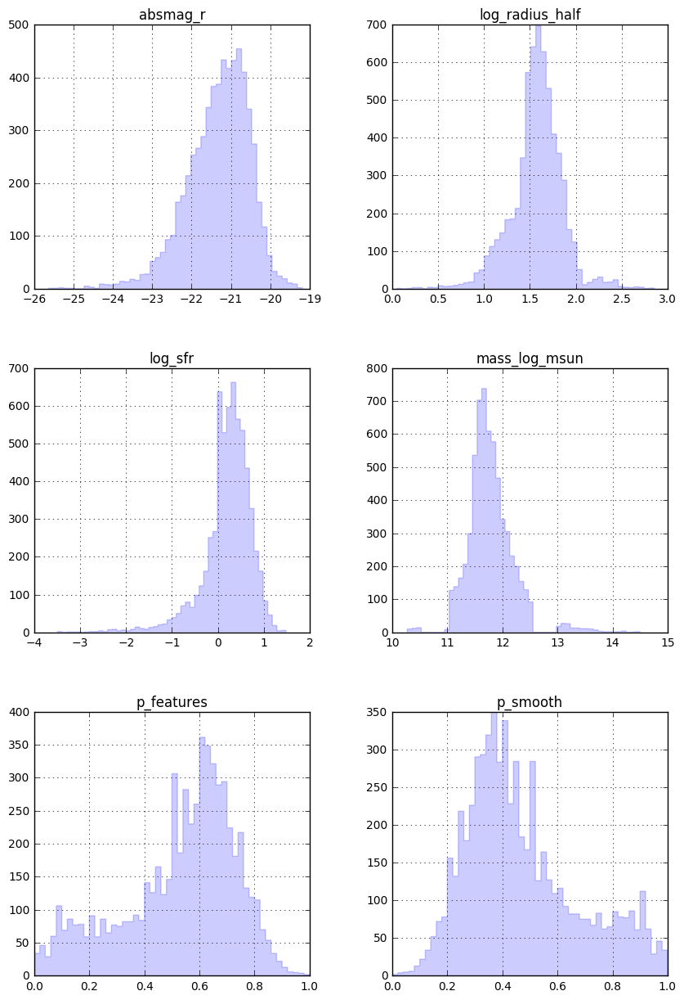

In [25]:
galaxyPropertiesAndVotesIllustrisFrame['radius_half'] = 10**galaxyPropertiesAndVotesIllustrisFrame['log_radius_half']
galaxyPropertiesAndVotesIllustrisFrame['mass_msun'] = 10**galaxyPropertiesAndVotesIllustrisFrame['mass_log_msun']
galaxyPropertiesAndVotesIllustrisFrame['sfr'] = 10**galaxyPropertiesAndVotesIllustrisFrame['log_sfr']
galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_view"].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'], histtype='step', fill=True, alpha=0.2)

### Plot distributions of summary quantities extracted from the GalaxyZoo database for the `fixed_mass` subset

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x10f54e320>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x10f99c470>]], dtype=object)

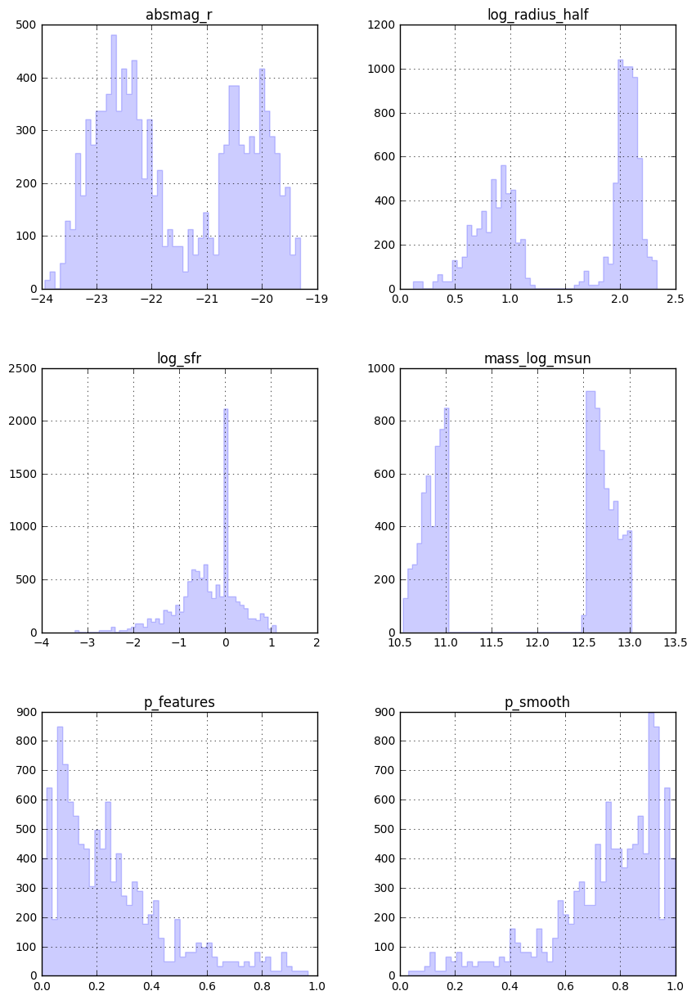

In [26]:
galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_mass"].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'], histtype='step', fill=True, alpha=0.2)

### Plot distributions of summary quantities extracted from the GalaxyZoo database for the `first_fixed_mass` subset

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x10ba1a710>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x10e554c88>]], dtype=object)

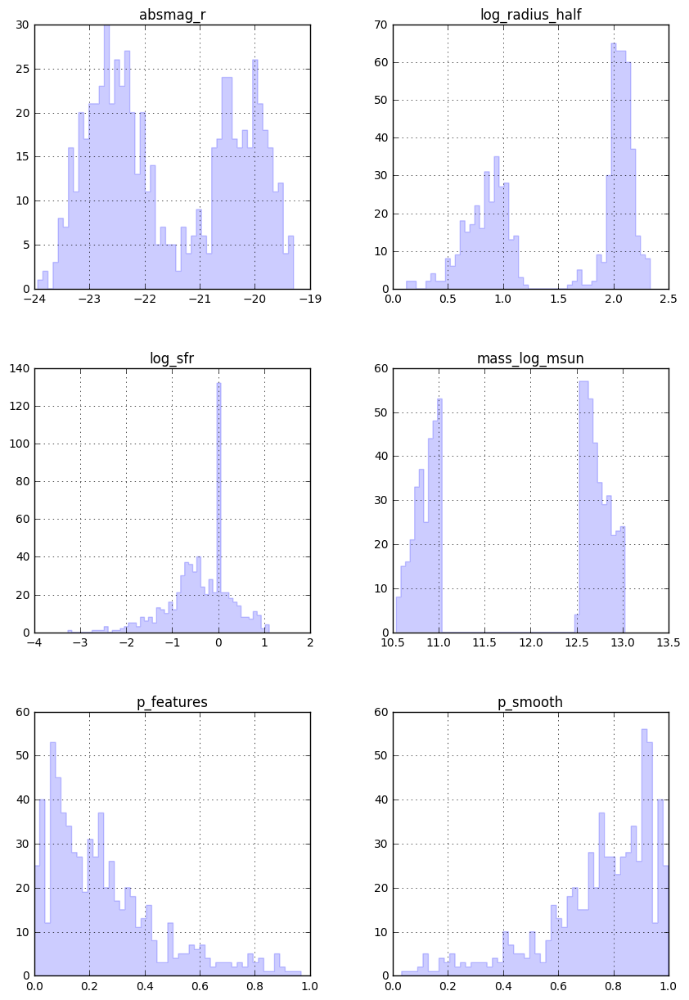

In [27]:
galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "first_fixed_mass"].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'], histtype='step', fill=True, alpha=0.2)

### Plot distributions of summary quantities extracted from the GalaxyZoo database for the combined `fixed_view` and `first_fixed_mass` subset

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x110bc3e48>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x1110c8780>]], dtype=object)

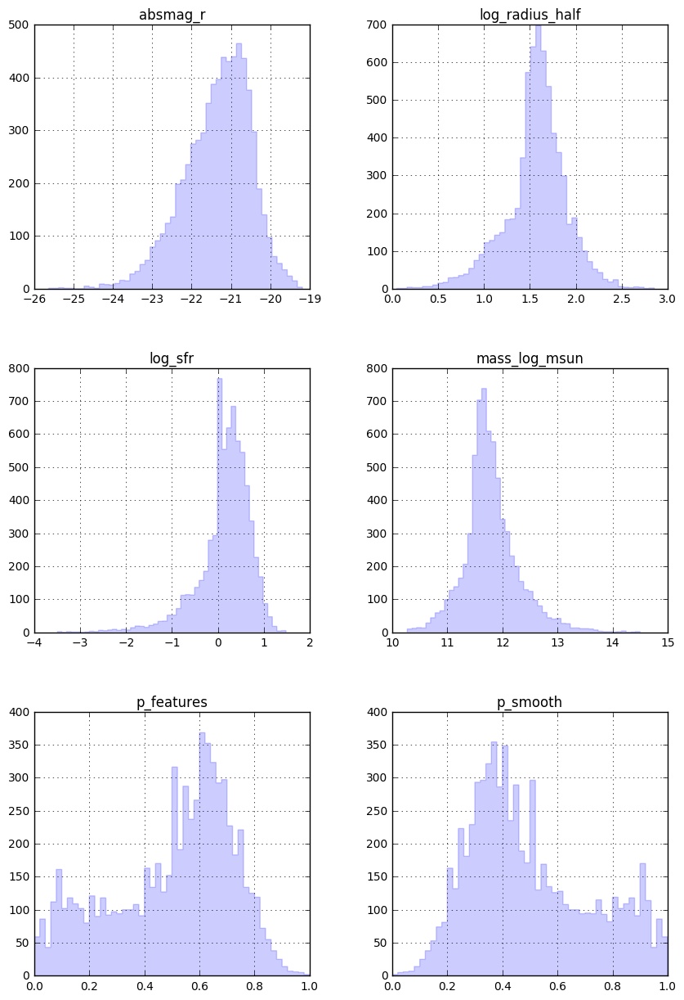

In [28]:
galaxyPropertiesAndVotesIllustrisFrame[(galaxyPropertiesAndVotesIllustrisFrame['priority'] == "first_fixed_mass") | (galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_view")].hist(bins=50, figsize=(10, 15), column=["mass_log_msun", "log_radius_half", "log_sfr", "absmag_r", 'p_smooth', 'p_features'], histtype='step', fill=True, alpha=0.2)

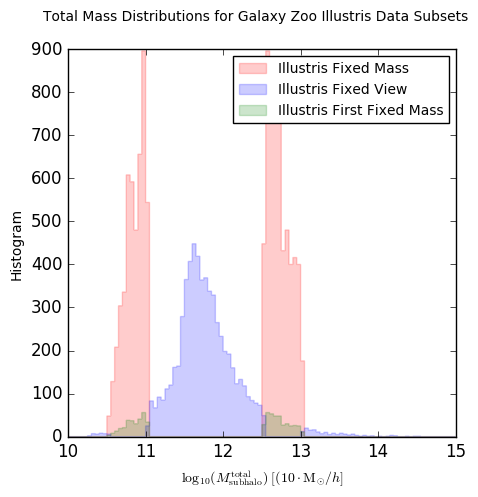

In [29]:
gc.collect()
massSelectionFigure = plt.figure(figsize=(5, 5))
axes = galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_mass"]["mass_log_msun"].plot.hist(ax = massSelectionFigure.gca(), ec='r', fc='r',histtype='step', fill=True, alpha=0.2, label='Fixed Mass', bins=100, range=(10, 15))
axes = galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "fixed_view"]["mass_log_msun"].plot.hist(ax = axes, ec='b', fc='b',histtype='step', fill=True, alpha=0.2, label='Fixed View', bins=100, range=(10, 15))
axes = galaxyPropertiesAndVotesIllustrisFrame[galaxyPropertiesAndVotesIllustrisFrame['priority'] == "first_fixed_mass"]["mass_log_msun"].plot.hist(ax = axes, ec='g', fc='g',histtype='step', fill=True, alpha=0.2, label='First Fixed View', bins=100, range=(10, 15))
lines, labels = massSelectionFigure.gca().get_legend_handles_labels()
labels = ['Illustris Fixed Mass', 'Illustris Fixed View', 'Illustris First Fixed Mass']
massSelectionFigure.gca().legend(lines[:3], labels[:3], loc='best', fontsize='medium')
massSelectionFigure.gca().tick_params(labelsize=12)
plt.suptitle('Total Mass Distributions for Galaxy Zoo Illustris Data Subsets', fontsize='medium')
plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm total})\;[(10\cdot{\rm M_{\odot}}/h]$', fontsize='medium')
plt.ylabel('Histogram', fontsize='medium')    

### Use the Illustris web service to obtain detailed information for the subset of galaxies used in GalaxyZoo.
The GalaxyZoo mongo database entry for each subject includes a `metadata` field, which includes a subset of salient information about provided by the Illustris team for each subhalo in the GalaxyZoo database.

Far more detailed information can be retrieved for each subhalo using the **Illustris web service**.

The API key must be renewed by logging into the [*Illustris* public data access site](http://www.illustris-project.org/data/) and will remain current until you explicity log out. Update the subsequent cell with your personall API access key.

In [30]:
illustrisAPIKey="44ddc0a0574472a27514600007f1a6a1"

Use the `requests` module to retrieve data frome the *Illustris* web service.

In [31]:
import requests
baseUrl = 'http://www.illustris-project.org/api/'
headers = {"api-key":illustrisAPIKey}

Define a utility function to retrieve data by supplying a constructed web service path.

In [32]:
def get(path, params=None):
    # make HTTP GET request to path
    r = requests.get(path, params=params, headers=headers)
    
    # raise exception if response code is not HTTP SUCCESS (200)
    r.raise_for_status()
    
    if r.headers['content-type'] == 'application/json':
        return r.json() # parse json responses automatically
    return r

Sending a request to the base URL of the web service returns a high level description of the available datasets and the base URLs that should be queried to access them.

In [33]:
illustrisWebService = get(baseUrl)
if verbose :
    prettyPrinter.pprint(illustrisWebService)

Metadata about available simulation data are stored under the `simulations` key. In fact, querying the base URL only returns the `simulations` key, but this extral level of structure is likely provided to enable extensibility in the future.

Each element of the data structure uder the `simulations` key contains three sub-elements:
1. `name` - A human-readable name for the simulation e.g "Illustris-1"
    - The number (1-3) in the suffix correpsonds to the number of n-body particles used to simulate the various components (dark matter, gas, stars etc.) in the simulation. Lower numbers correspond to more particles and therefore to a hugher overall resoltution for the simulation.
    - A `-Dark` suffix is used to indicate dark-matter-only simulations that do not simulate gas and stellar dynamics.
    - Some simulations have also
2. `num_snapshots` - Each simulation dataset comprises a series of "snapshots" that capture the state of the simulation at a particular reshift (or alternatively, expansion factor). This datum specifies the number of such snapshots for each simulation set.
3. `url` - The base URL to query for data pertaining to the named simulation set.

In [34]:
simulationsData = illustrisWebService['simulations']
if verbose :
    prettyPrinter.pprint(simulationsData)

The names of the various simulation datasets can be isolated by indexing the data structure stored under the `simulations` key.

In [35]:
illustrisSimulationNames = [ entry['name'] for entry in simulationsData ]
if verbose :
    prettyPrinter.pprint(illustrisSimulationNames)

Use the highest resolution simulation with the full physics model i.e. `Illustris-1`. Begin by determining the numerical index in the list of dataset names that corresponds to the required simulation.

In [36]:
illustris1SimulationIndex = illustrisSimulationNames.index('Illustris-1')

Retrieve more detailed metadata that correspond to the `Illustris-1` dataset.

In [37]:
illustris1Data = get(simulationsData[illustris1SimulationIndex]['url'])
if verbose :
    prettyPrinter.pprint(illustris1Data)

Retrieve metadata about the snapshots that comprise the `Illustris-1` dataset.

In [38]:
illustris1SnapshotsUrl = illustris1Data['snapshots']
illustris1Snapshots = get(illustris1SnapshotsUrl)

Retrive metadata describing the lowest redshift snapshot i.e. that with the highest numerical index.

In [39]:
illustris1RedshiftZeroSnapshot = get(illustris1Snapshots[-1]['url'])
if verbose :
    prettyPrinter.pprint(illustris1RedshiftZeroSnapshot)

### Retrieve and serialize **metadata** for **all** subhalos in the "zero" redshift slice
Retrieve metadata describing the individual sub-halos comprising the snapshot from the *Illustris* web service in batches of $10^5$ until the number of unique sub-halos that comprised the original GalaxyZoo Illustris sample ($\sim6\times10^{5}$) is exceeded.

In [40]:
illustris1RedshiftZeroSubHalos = get(illustris1RedshiftZeroSnapshot['subhalos'], {'limit':10000})
illustris1RedshiftZeroSubHaloMetaData = illustris1RedshiftZeroSubHalos['results']

The data that are returned include an index named `next` that derefernces to a URL can be used to retrieve the next block of $10^{5}$ halo metadata. Recursively query this URL until data for the requisite number of halos have been retrieved.

In [41]:
if saveIllustrisHaloData :
    while len(illustris1RedshiftZeroSubHaloMetaData) < galaxyPropertiesIllustrisFrame.index.max() and illustris1RedshiftZeroSubHalos['next'] is not None :
        illustris1RedshiftZeroSubHalos = get(illustris1RedshiftZeroSubHalos['next'])
        illustris1RedshiftZeroSubHaloMetaData.extend(illustris1RedshiftZeroSubHalos['results'])
        if verbose :
            # How many halos have data been downloaded for?
            print(len(illustris1RedshiftZeroSubHaloMetaData))
            # The URL that should be queried to retrieve the next block of data
            print(illustris1RedshiftZeroSubHalos['next'])
else :
    print ('Loading data from "{0}"...'.format(pickleMetaDataPath))
    pickleMetaDataFile = open(pickleMetaDataPath, mode='rb')
    illustris1RedshiftZeroSubHaloMetaDataFrame = pickle.load(pickleMetaDataFile)
    pickleMetaDataFile.close()

Loading data from "/Users/hughdickinson/Documents/Development/Sloan-Illustris-Comparison/data/IllustrisHaloMetaData.pkl"...


Wrap the retrieved data in a `pandas.DataFrame` to simplify manipulation and plotting.

In [42]:
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloMetaDataFrame = pd.DataFrame(illustris1RedshiftZeroSubHaloMetaData)
    illustris1RedshiftZeroSubHaloMetaDataFrame = illustris1RedshiftZeroSubHaloMetaDataFrame.set_index("id")
if verbose:
    display(illustris1RedshiftZeroSubHaloMetaDataFrame)
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloMetaDataFrame.to_pickle(pickleMetaDataPath)

### Sanity Check

As a consistency check, compare the masses of the subhalos retrieved from the GalaxyZoo database with those retrieved directly from the *Illustris* web service. They should be very close if the data correspond to the same subhalos. **NOTE:** Numerical accuracy may prevent exact matches between the two data sources.

Perform a merge which extracts metadata from the **full** (web-service-provided) Illustris zero-redshift subhalo sample with `subhalo_id` values that match those in the GalaxyZoo mongo database.

In [43]:
galaxyPropertiesIllustrisWithUrlFrame = galaxyPropertiesAndVotesIllustrisFrame.merge(illustris1RedshiftZeroSubHaloMetaDataFrame,
                                                                                     how='left', 
                                                                                     left_index=True, 
                                                                                     right_index=True,
                                                                                     suffixes=("_gz2", "_illustris_db"))
if verbose :
    display(galaxyPropertiesIllustrisWithUrlFrame)
    display(galaxyPropertiesIllustrisWithUrlFrame.columns.values)

Add a column listing (`mass_log_msun_delta`) the computed difference between the mass values provided from the Illustris web service and those stored in the GalaxyZoo mongo database.

In [44]:
galaxyPropertiesIllustrisWithUrlFrame["mass_log_msun_delta"] = galaxyPropertiesIllustrisWithUrlFrame["mass_log_msun_gz2"] - galaxyPropertiesIllustrisWithUrlFrame["mass_log_msun_illustris_db"] 
if verbose :
    display(galaxyPropertiesIllustrisWithUrlFrame)
    display(galaxyPropertiesIllustrisWithUrlFrame.columns.values)

Generate plots comparing the mass estimates stored in the metadata for each subject in the the GalaxyZoo mongo database with those retrieved directly from the Illustris web service for the same `subhalo_id`s.

First make the plot for **all** `subhalo_id` values.

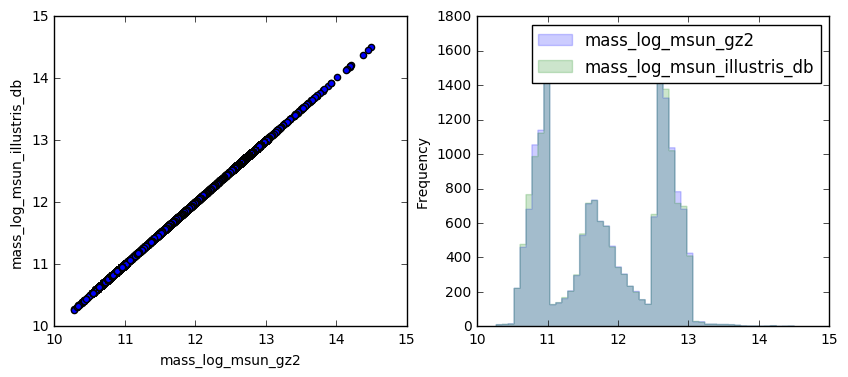

In [45]:
massCompPlots = plt.figure(figsize=(10, 4))
massCompScatterAxes = massCompPlots.add_subplot(1,2,1)
massCompHistAxes = massCompPlots.add_subplot(1,2,2)
massCompScatterAxes = galaxyPropertiesIllustrisWithUrlFrame.plot.scatter(x="mass_log_msun_gz2", y="mass_log_msun_illustris_db", ax=massCompScatterAxes)
massCompHistAxes = galaxyPropertiesIllustrisWithUrlFrame[["mass_log_msun_gz2", "mass_log_msun_illustris_db"]].plot.hist(bins=50, ax=massCompHistAxes,histtype='step', fill=True, alpha=0.2)

Now isolate the `fixed_mass` sample.

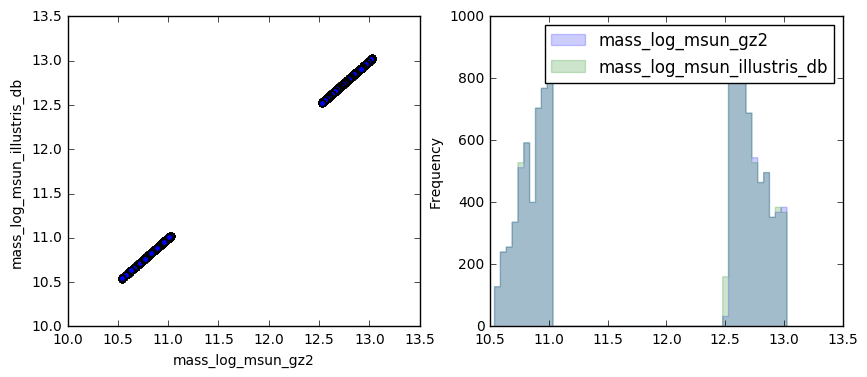

In [46]:
fixedMassMassCompPlots = plt.figure(figsize=(10, 4))
fixedMassMassCompScatterAxes = fixedMassMassCompPlots.add_subplot(1,2,1)
fixedMassMassCompHistAxes = fixedMassMassCompPlots.add_subplot(1,2,2)
fixedMassMassCompScatterAxes = galaxyPropertiesIllustrisWithUrlFrame[galaxyPropertiesIllustrisWithUrlFrame['priority'] == 'fixed_mass'].plot.scatter(x="mass_log_msun_gz2", y="mass_log_msun_illustris_db", ax=fixedMassMassCompScatterAxes)
fixedMassMassCompHistAxes = galaxyPropertiesIllustrisWithUrlFrame[galaxyPropertiesIllustrisWithUrlFrame['priority'] == 'fixed_mass'][["mass_log_msun_gz2", "mass_log_msun_illustris_db"]].plot.hist(bins=50, ax=fixedMassMassCompHistAxes, histtype='step', fill=True, alpha=0.2)

Now isolate the `fixed_view` sample.

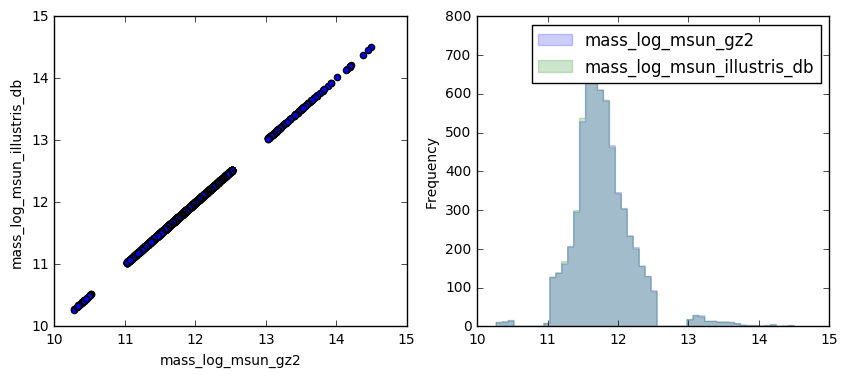

In [47]:
fixedViewMassCompPlots = plt.figure(figsize=(10, 4))
fixedViewMassCompScatterAxes = fixedViewMassCompPlots.add_subplot(1,2,1)
fixedViewMassCompHistAxes = fixedViewMassCompPlots.add_subplot(1,2,2)
fixedViewMassCompScatterAxes = galaxyPropertiesIllustrisWithUrlFrame[galaxyPropertiesIllustrisWithUrlFrame['priority'] == 'fixed_view'].plot.scatter(x="mass_log_msun_gz2", y="mass_log_msun_illustris_db", ax=fixedViewMassCompScatterAxes)
fixedViewMassCompHistAxes = galaxyPropertiesIllustrisWithUrlFrame[galaxyPropertiesIllustrisWithUrlFrame['priority'] == 'fixed_view'][["mass_log_msun_gz2", "mass_log_msun_illustris_db"]].plot.hist(bins=50, ax=fixedViewMassCompHistAxes, histtype='step', fill=True, alpha=0.2)

**NOTE**: Apparently the `fixed_mass` and `fixed_view` subsets are **disjoint**.

### Retrieve the full data for each subhalo with a corresponding subject in GalaxyZoo 4 (Illustris subset)
So far, metadata have been retrieved for **all** subhalos comprising the Illustris-1 zero-redshift dataset. Now selectively download the **full** data for halos that were included in the initial GalaxyZoo dataset.

There are **17046** Illustris subjects that have been classified in GalaxyZoo. For the `fixed_mass` subset, there will be 16 instances of the same halo, so some of the subsequent downloads are likely unnecessary. However to be certain, the duplicate data are downloaded anyway. 

The downloaded data are serialized to a file in order to save repeated time-consuming downloads.

In [48]:
illustris1RedshiftZeroSubHaloDataFrame = None
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloData = []
    while len(illustris1RedshiftZeroSubHaloData) < len(galaxyPropertiesIllustrisWithUrlFrame.index) :
        numToRetrieve = min(galaxyPropertiesIllustrisWithUrlFrame.size - len(illustris1RedshiftZeroSubHaloData), 100)
        illustris1RedshiftZeroSubHaloData.extend([get(subHaloUrl) for subHaloUrl in galaxyPropertiesIllustrisWithUrlFrame.iloc[len(illustris1RedshiftZeroSubHaloData):len(illustris1RedshiftZeroSubHaloData) + numToRetrieve]['url']])
        print ('Retrieved {0} subHalo datasets.'.format(len(illustris1RedshiftZeroSubHaloData)))
else :
    pickleDataFile = open(pickleDataPath, mode='rb')
    illustris1RedshiftZeroSubHaloDataFrame = pickle.load(pickleDataFile) 
    pickleDataFile.close()

### Store the retrieved data in a `pandas.DataFrame` to enable more straightforward manipulation...

In [49]:
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloDataFrame = pd.DataFrame(illustris1RedshiftZeroSubHaloData)

### ... and save time retrieving the data again by serializing to a local picklefile.

In [50]:
if saveIllustrisHaloData :
    illustris1RedshiftZeroSubHaloDataFrame.to_pickle(pickleDataPath)

In [51]:
if verbose :
    prettyPrinter.pprint(illustris1RedshiftZeroSubHaloDataFrame.columns)

### Plot selected distributions of Illustris-computed "true" subhalo parameters 
These plots can be used to distributions of properties that may have observable proxies or couterparts, but which are computed purely using knowledge of the simulated particles comprising the subhalo.

**TODO:** To add other plots here just add more of the column names listed above between the square brackets i.e.

```python
illustris1RedshiftZeroSubHaloDataFrame[['gasmetallicityhalfrad', 'veldisp', <add more columns here...>]]...
```

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x116df3ac8>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x116e379e8>]], dtype=object)

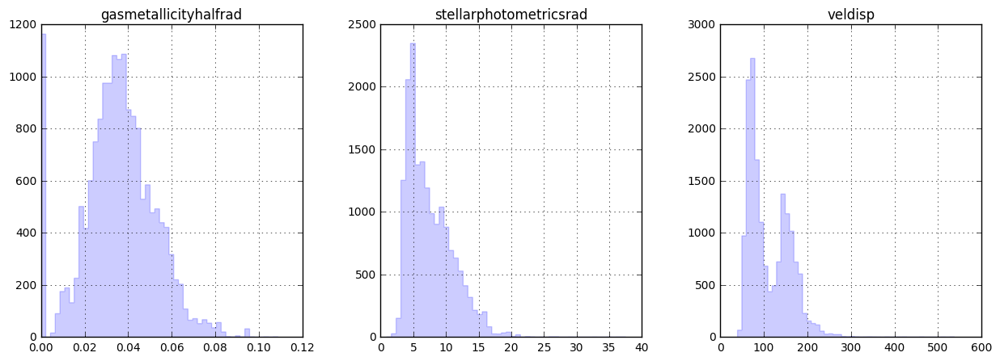

In [52]:
illustris1RedshiftZeroSubHaloDataFrame[['gasmetallicityhalfrad', 'veldisp', 'stellarphotometricsrad']].hist(bins=50, 
                                                                                                            figsize=(15, 5),
                                                                                                            layout=(1, 3),
                                                                                                            histtype='step', 
                                                                                                            fill=True, 
                                                                                                            alpha=0.2)

Plot the distribution of stellar photometric radii with a logarithmic y-axis.

**Note**: The Illustris documentation specifies this field as: 
> Radius at which the surface brightness profile (computed from all member stellar particles) drops below the limit of $20.7\,{\rm mag\, arcsec}^{−22}$ in the K band (in comoving units).

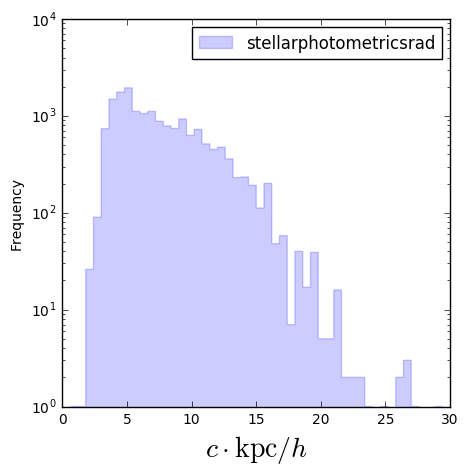

In [53]:
illustris1RedshiftZeroSubHaloDataFrame[['stellarphotometricsrad']].plot.hist(bins=50, 
                                                                             range=(0, 30),
                                                                             figsize=(5, 5),
                                                                             logy=True, 
                                                                             histtype='step', 
                                                                             fill=True, 
                                                                             alpha=0.2)
plt.xlabel(r'$c\cdot{\rm kpc}/h$', fontsize='20')


### Combined the full data with the prevously extracted metadata for each subhalo

In [119]:
finalIllustris1RedshiftZeroSubHaloDataFrame = galaxyPropertiesIllustrisWithUrlFrame.merge(illustris1RedshiftZeroSubHaloDataFrame.drop_duplicates(subset=['id']), 
                                                                                          how='left', 
                                                                                          left_index=True, 
                                                                                          right_on='id',
                                                                                          suffixes=("_meta", "_full"))
if verbose :
    display(finalIllustris1RedshiftZeroSubHaloDataFrame.columns.values)
    display(finalIllustris1RedshiftZeroSubHaloDataFrame)    

### Extract and plot the images that comprised the GalaxyZoo Illustris datasets
Extract and plot 20 random images from the `fixed_mass` and `fixed_view` subsamples.

First randomly select 20 images from the `fixed_view` sample.

HALO ID: 16982 404


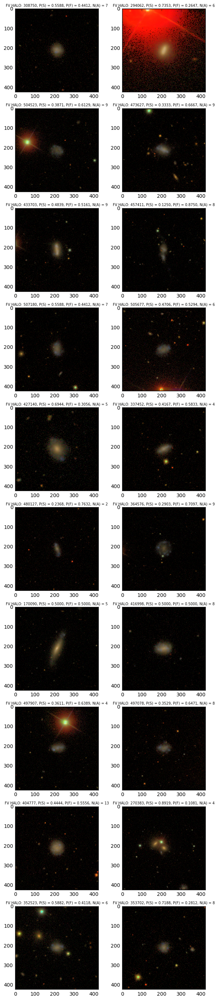

In [55]:
plt.figure(figsize=(7, 35))
subPlotNum = 1
while subPlotNum < 21 :
    try :
        row = finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] == 'fixed_view'][['supplementary_data','id', 'p_smooth', 'p_features', 'num_artifact']].sample(1)
        imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
        haloId = row['id'].values[0] 
        pSmooth = row['p_smooth'].values[0] 
        pFeatures = row['p_features'].values[0] 
        nArtifact = row['num_artifact'].values[0]
        http = urllib3.PoolManager()
        resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
        content = resp.data
        if resp.status != 200 :
            print('HALO ID:',haloId ,resp.status)
            continue
        fakeFile = io.BytesIO()
        fakeFile.write(content)
        plt.subplot(10,2,subPlotNum)
        image = skimage.io.imread(fakeFile)
        plt.imshow(image)
        plt.title('FV HALO: {0}, P(S) = {1:.4f}, P(F) = {2:.4f}, N(A) = {3}'.format(haloId, pSmooth, pFeatures, nArtifact), fontsize=7)
        subPlotNum += 1
    except KeyError :
        continue

Now the `fixed_mass` subset.

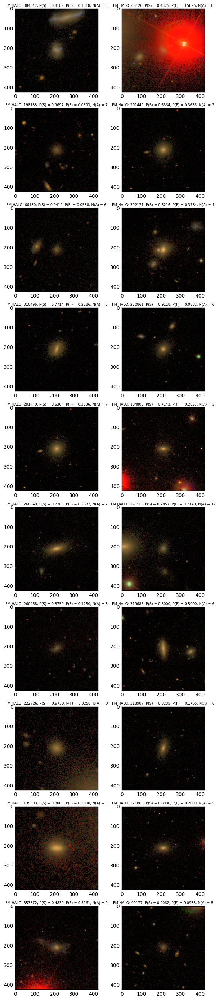

In [56]:
plt.figure(figsize=(7, 35))
subPlotNum = 1
while subPlotNum < 21 :
    try :
        row = finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] == 'fixed_mass'][['supplementary_data','id', 'p_smooth', 'p_features', 'num_artifact']].sample(1)
        imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
        haloId = row['id'].values[0] 
        pSmooth = row['p_smooth'].values[0] 
        pFeatures = row['p_features'].values[0]
        nArtifact = row['num_artifact'].values[0]
        http = urllib3.PoolManager()
        resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
        content = resp.data
        if resp.status != 200 :
            print('HALO ID:',haloId ,resp.status)
            continue
        fakeFile = io.BytesIO()
        fakeFile.write(content)
        plt.subplot(10,2,subPlotNum)
        image = skimage.io.imread(fakeFile)
        plt.imshow(image)
        plt.title('FM HALO: {0}, P(S) = {1:.4f}, P(F) = {2:.4f}, N(A) = {3}'.format(haloId, pSmooth, pFeatures, nArtifact),fontsize=7)
        subPlotNum += 1
    except KeyError :
        continue

## Plot subsets of *featured* classified as *edge on* or *not edge on*
A subject os defined to be *featured* if `p_features` > 0.6.

### Start with the *edge on* subset

Number of Halos with p_features > 0.6 and a majority of "edge on" classifications is 269.
Number of Halos with only a majority of "edge on" classifications is 3229.


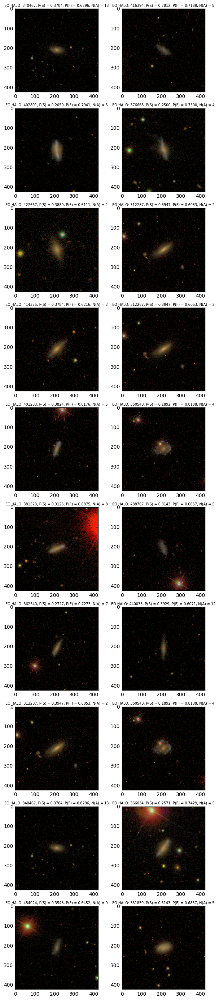

In [57]:
plt.figure(figsize=(7, 35))
subPlotNum = 1
while subPlotNum < 21 :
    try :
        row = finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['is_features_and_edge_on']][['supplementary_data','id', 'p_smooth', 'p_features', 'num_artifact']].sample(1)
        imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
        haloId = row['id'].values[0] 
        pSmooth = row['p_smooth'].values[0] 
        pFeatures = row['p_features'].values[0]
        nArtifact = row['num_artifact'].values[0]
        http = urllib3.PoolManager()
        resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
        content = resp.data
        if resp.status != 200 :
            print('HALO ID:',haloId ,resp.status)
            continue
        fakeFile = io.BytesIO()
        fakeFile.write(content)
        plt.subplot(10,2,subPlotNum)
        image = skimage.io.imread(fakeFile)
        plt.imshow(image)
        plt.title('EO HALO: {0}, P(S) = {1:.4f}, P(F) = {2:.4f}, N(A) = {3}'.format(haloId, pSmooth, pFeatures, nArtifact),fontsize=7)
        subPlotNum += 1
    except KeyError :
        continue
print ('Number of Halos with p_features > 0.6 and a majority of "edge on" classifications is {}.'.format(np.sum(finalIllustris1RedshiftZeroSubHaloDataFrame['is_features_and_edge_on'].values)))
print ('Number of Halos with only a majority of "edge on" classifications is {}.'.format(np.sum(finalIllustris1RedshiftZeroSubHaloDataFrame['is_edge_on'].values)))

### Now the *not edge on* subset

HALO ID: 30515 404


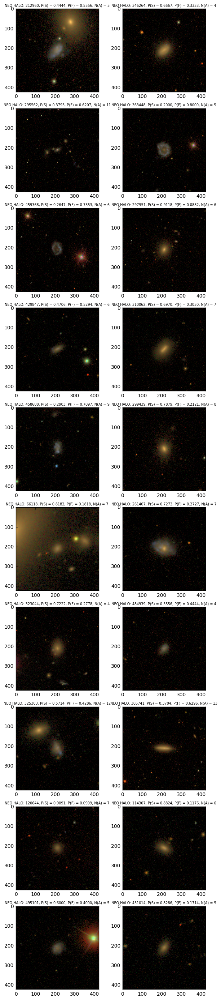

In [58]:
plt.figure(figsize=(7, 35))
subPlotNum = 1
while subPlotNum < 21 :
    try :
        row = finalIllustris1RedshiftZeroSubHaloDataFrame[np.logical_not(finalIllustris1RedshiftZeroSubHaloDataFrame['is_features_and_edge_on'])][['supplementary_data','id', 'p_smooth', 'p_features', 'num_artifact']].sample(1)
        imageUrl = row['supplementary_data'].values[0]['stellar_mocks']['image_gz']
        haloId = row['id'].values[0] 
        pSmooth = row['p_smooth'].values[0] 
        pFeatures = row['p_features'].values[0]
        nArtifact = row['num_artifact'].values[0]
        http = urllib3.PoolManager()
        resp = http.request('GET', imageUrl, headers = {'API-Key': '44ddc0a0574472a27514600007f1a6a1'})
        content = resp.data
        if resp.status != 200 :
            print('HALO ID:',haloId ,resp.status)
            continue
        fakeFile = io.BytesIO()
        fakeFile.write(content)
        plt.subplot(10,2,subPlotNum)
        image = skimage.io.imread(fakeFile)
        plt.imshow(image)
        plt.title('NEO HALO: {0}, P(S) = {1:.4f}, P(F) = {2:.4f}, N(A) = {3}'.format(haloId, pSmooth, pFeatures, nArtifact),fontsize=7)
        subPlotNum += 1
    except KeyError :
        continue

### Create views of the dataframe for the `fixed_mass` , `fixed_view`, `edge_on`, and `not_edge_on` subsets

In [121]:
finalIllustris1RedshiftZeroSubHaloDataFrames = {'full' : finalIllustris1RedshiftZeroSubHaloDataFrame,
                                                'fixed_mass' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] =='fixed_mass'],
                                                'fixed_view' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] =='fixed_view'],
                                                'fixed_view_and_first_fixed_mass' : finalIllustris1RedshiftZeroSubHaloDataFrame[(finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] =='fixed_view') | (finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] =='first_fixed_mass')],
                                                'first_fixed_mass' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['priority'] =='first_fixed_mass'],
                                                'edge_on' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['is_edge_on']],
                                                'not_edge_on' : finalIllustris1RedshiftZeroSubHaloDataFrame[np.logical_not(finalIllustris1RedshiftZeroSubHaloDataFrame['is_edge_on'])],
                                                'features_and_edge_on' : finalIllustris1RedshiftZeroSubHaloDataFrame[finalIllustris1RedshiftZeroSubHaloDataFrame['is_features_and_edge_on']]
                                                }

677


## Investigate the mapping between Illustris total and stellar mass selections

In [61]:
hubbleH = 0.74

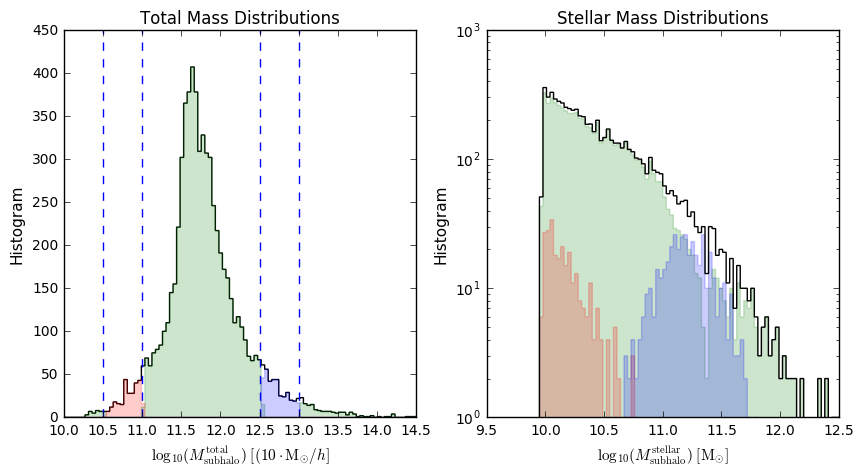

In [62]:
gc.collect()
massSelectionFigure = plt.figure(figsize=(10, 5))

lowCut = lambda dataFrame : (dataFrame['mass_log_msun'] > 10.5) & (dataFrame['mass_log_msun'] < 11.0) 
highCut = lambda dataFrame : (dataFrame['mass_log_msun'] > 12.5) & (dataFrame['mass_log_msun'] < 13.0) 

subplot1 = plt.subplot(1,2,1)

finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_view_and_first_fixed_mass']['mass_log_msun'].plot.hist(ax=subplot1, bins=100, range=(10,14.5), histtype='step', color='k', fill=False, label='mass_log_msun')
finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_view']['mass_log_msun'].plot.hist(ax=subplot1, bins=100, range=(10,14.5), histtype='step', color='g', fc='g', fill=True, alpha=0.2, label='mass_log_msun')
fixedMassDataFrame = finalIllustris1RedshiftZeroSubHaloDataFrames['first_fixed_mass']
fixedMassDataFrame[lowCut(fixedMassDataFrame)]['mass_log_msun'].plot.hist(ax=subplot1, bins=100, range=(10,14.5), color='r', fc='r', histtype='step', fill=True, alpha=0.2, label='mass_log_msun')
fixedMassDataFrame[highCut(fixedMassDataFrame)]['mass_log_msun'].plot.hist(ax=subplot1, bins=100, range=(10,14.5), color='b', fc='b', histtype='step', fill=True, alpha=0.2, label='mass_log_msun')
plt.axvline(10.5, ls='dashed')
plt.axvline(11.0, ls='dashed')
plt.axvline(12.5, ls='dashed')
plt.axvline(13.0, ls='dashed')
plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm total})\;[(10\cdot{\rm M_{\odot}}/h]$', fontsize=11)
plt.ylabel('Histogram', fontsize=11)
plt.title('Total Mass Distributions')

subplot2 = plt.subplot(1,2,2)

fullDataFrame = finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_view_and_first_fixed_mass']
fixedViewDataFrame = finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_view']

stellarMassesAll = np.log10(10**10*fullDataFrame["mass_stars"]/hubbleH)
stellarMassesLowCut = np.log10(10**10*fullDataFrame[lowCut(fullDataFrame)]["mass_stars"]/hubbleH)
stellarMassesHighCut = np.log10(10**10*fullDataFrame[highCut(fullDataFrame)]["mass_stars"]/hubbleH)
stellarMassesFixedView = np.log10(10**10*fixedViewDataFrame["mass_stars"]/hubbleH)

stellarMassesFixedView.plot.hist(bins=100, range=(9.5, 12.5), histtype='step', color='g', fc='g', fill=True, alpha=0.2, logy=True)
stellarMassesLowCut.plot.hist(bins=100, range=(9.5, 12.5), histtype='step', color='r', fc='r',fill=True, alpha=0.2, logy=True)
stellarMassesHighCut.plot.hist(bins=100, range=(9.5, 12.5), histtype='step', color='b', fc='b', fill=True, alpha=0.2, logy=True)
stellarMassesAll.plot.hist(bins=100, range=(9.5, 12.5), histtype='step', color='k', fill=False, logy=True)

plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=11)
plt.ylabel('Histogram', fontsize=11)
plt.title('Stellar Mass Distributions')

### *Question:* Is it feasible to select subsets of SDSS data that "correspond" to the Illustris `fixed_mass` selections?

### Transform the simulated subhalo properties to enable comparison with observational counterparts
The units and scalings that characterize the Illustris data are optimized to enable analytical uniformity across redshift slices, however they are ot ideal for comparison with observational data at low reshifts.

The prescription outlined [here](http://ramon-1.wikispaces.com/Illustris) can be used to compute and plot the distribution of the stellar masses associated with each subhalo that has been classified in GalaxyZoo.

#### First plot the distribution for **all** subhalos.

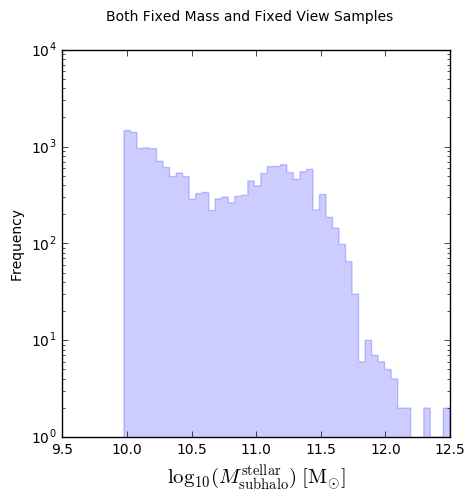

In [63]:
gc.collect()
plt.figure(figsize=(5, 5))
plt.suptitle('Both Fixed Mass and Fixed View Samples')
illustrisStellarMassesFull = np.log10(10**10*finalIllustris1RedshiftZeroSubHaloDataFrames['full']["mass_stars"]/hubbleH)
logMassAxes = illustrisStellarMassesFull.plot.hist(bins=50, logy=True, histtype='step', fill=True, alpha=0.2)
plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)

#### Now isolate the `fixed_view` sample.

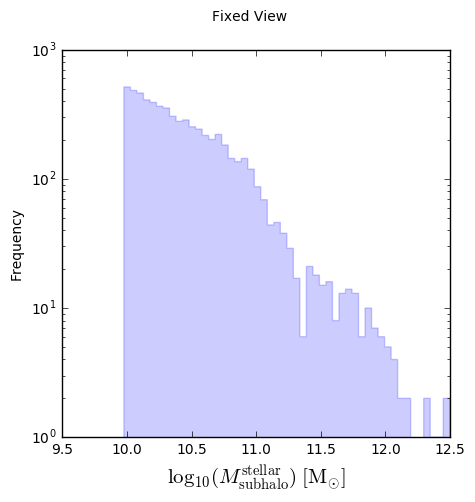

In [64]:
plt.figure(figsize=(5, 5))
plt.suptitle("Fixed View")
illustrisStellarMassesFixedView = np.log10(10**10*finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_view']["mass_stars"]/hubbleH)
logMassAxes = illustrisStellarMassesFixedView.plot.hist(bins=50, logy=True, histtype='step', fill=True, alpha=0.2)
plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)

#### Now isolate the `fixed_mass` sample.

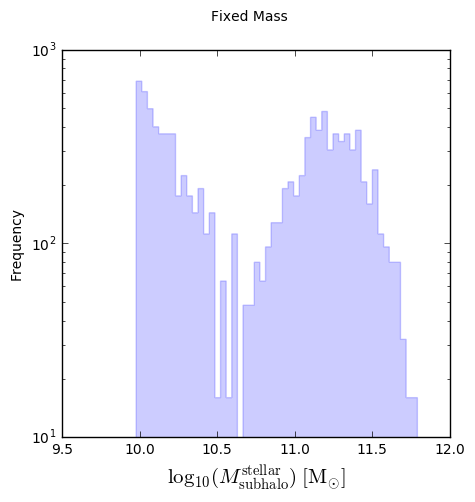

In [65]:
plt.figure(figsize=(5, 5))
plt.suptitle("Fixed Mass")
illustrisStellarMassesFixedMass = np.log10(10**10*finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_mass']["mass_stars"]/hubbleH)
logMassAxes = illustrisStellarMassesFixedMass.plot.hist(bins=50, logy=True, histtype='step', fill=True, alpha=0.2)
plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)

#### Finally plot the combined `fixed_view` and `first_fixed_mass` samples

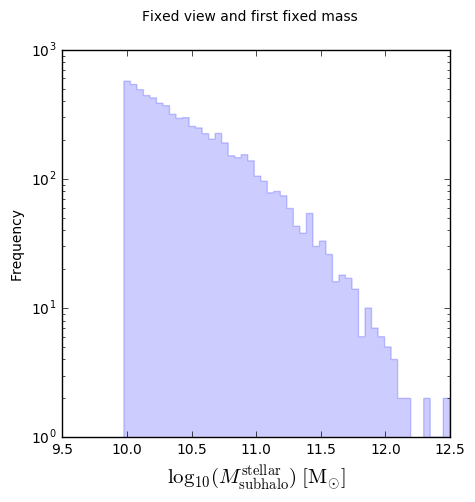

In [66]:
plt.figure(figsize=(5, 5))
plt.suptitle("Fixed view and first fixed mass")
illustrisStellarMassesFixedViewAndFirstFixedMass = np.log10(10**10*finalIllustris1RedshiftZeroSubHaloDataFrames['fixed_view_and_first_fixed_mass']["mass_stars"]/hubbleH)
logMassAxes = illustrisStellarMassesFixedViewAndFirstFixedMass.plot.hist(bins=50, logy=True, histtype='step', fill=True, alpha=0.2)
plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)

### Overplot the `fixed_mass` and `fixed_view` sample mass distributions

In [123]:
illustrisStellarMasses = { 'full' : illustrisStellarMassesFull,
                          'fixed_mass' : illustrisStellarMassesFixedMass,
                          'fixed_view' : illustrisStellarMassesFixedView,
                          'fixed_view_and_first_fixed_mass' : illustrisStellarMassesFixedViewAndFirstFixedMass
                         }

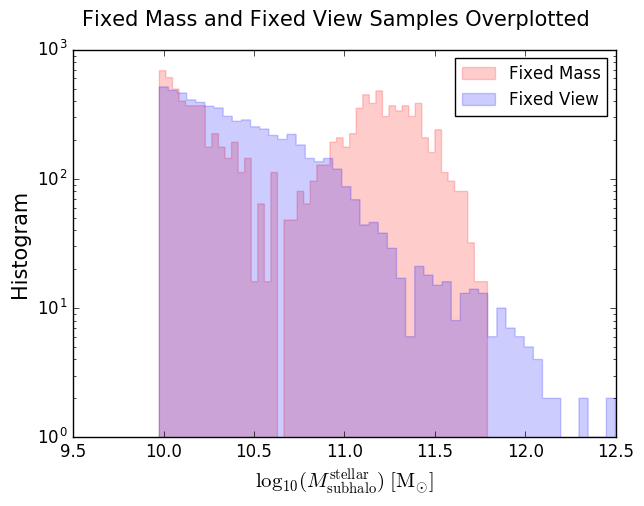

In [68]:
plt.figure(figsize=(7, 5))
logMassAxes = illustrisStellarMasses['fixed_mass'].plot.hist(bins=50, logy=True, color='r', histtype='step', fc='r', fill=True, alpha=0.2, label='Fixed Mass')
logMassAxes = illustrisStellarMasses['fixed_view'].plot.hist(bins=50, logy=True, color='b', histtype='step', fc='b', fill=True, alpha=0.2, ax=logMassAxes, label='Fixed View')
handles, labels = logMassAxes.get_legend_handles_labels()
logMassAxes.legend(handles, labels)
plt.gcf().gca().tick_params(labelsize=12)
plt.suptitle('Fixed Mass and Fixed View Samples Overplotted', fontsize=15)
plt.xlabel(r'$\log_{10}(M_{\rm subhalo}^{\rm stellar})\;[{\rm M_{\odot}}]$', fontsize=15)
plt.ylabel('Histogram', fontsize=15)

### Query the CasJobs interface to retrieve physical parameter estimates derived from observation

In [69]:
authToken = 'c1be471bc9ac483eac083829b6df30f7'
import SciServer.LoginPortal
SciServer.LoginPortal.setKeystoneToken(authToken)
userManager = SciServer.LoginPortal.getKeystoneUserWithToken(authToken)

In [70]:
print(userManager.userName)

hughdickinson


### Retrieve data for all SDSS galaxies that were classified in GalaxyZoo 2 and have 0.04 < z < 0.06
**Notes**:
The SDSS database lists numerous measurements and derived estimates of the **apparent** magnitude for many galaxies in its dataset. Here the magnitude computed within the **petrosian** radius in each of the SDSS bands (u,g,r,i,z) is used.

Apparent magnitudes are converted to an **absolute** magnitude using the function `fCosmoAbsMag` provided by the SDSS database server. Default values are used for the cosmological description which correspoond with WMAP-5 values. In contrast, the Illustris simulation framework assumes the WMAP-9 values for its cosmological simulation. Since the selected galaxies all have 0.04 < z < 0.06 and the zero-redshift slice of the Illustris simulation was used, this discrepancy should not be problematic.

Vote fraction "probabilities" derived from GalaxyZoo classifications are also extracted for all galaxies.

In [71]:
zooColumnQuery = """SELECT name FROM DBColumns WHERE tablename='zoo2MainSpecz' AND name <> 'specobjid'"""
zooColumnResult = CasJobs.executeQuery(zooColumnQuery, "dr10",token=authToken)
zooColumsString = ', '.join(['zoo.' + colName for colName in zooColumnResult['name']])

In [72]:
filters = ['u', 'g', 'r', 'i', 'z']
galaxyViewColumns = [ 'galView.expAB_' + filterName for filterName in filters ]
galaxyViewColumns.extend([ 'galView.deVAB_' + filterName for filterName in filters ])
galaxyViewColumns.extend([ 'galView.fracDeV_' + filterName for filterName in filters ])
galaxyViewColumns.extend([ 'galView.petror90_' + filterName for filterName in filters ])
galaxyViewColumnsString = ','.join(galaxyViewColumns)

In [73]:
sdssQuery = """SELECT spec.z, spec.zErr, spec.zWarning, 
spec.petroMag_u, spec.petroMag_g, spec.petroMag_r, spec.petroMag_i, spec.petroMag_z,   
dbo.fCosmoAbsMag(spec.petroMag_u,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_u,
dbo.fCosmoAbsMag(spec.petroMag_g,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_g,
dbo.fCosmoAbsMag(spec.petroMag_r,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_r,
dbo.fCosmoAbsMag(spec.petroMag_i,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_i,
dbo.fCosmoAbsMag(spec.petroMag_z,spec.z,DEFAULT,DEFAULT,DEFAULT,DEFAULT,DEFAULT) as absPetroMag_z,
""" + galaxyViewColumnsString + """
, zooSpecExtra.* FROM 
(
SELECT 
""" + zooColumsString + """, specExtra.*
FROM zoo2MainSpecz AS zoo 
LEFT JOIN 
galSpecExtra AS specExtra 
ON (specExtra.specObjID = zoo.specobjid) 
) 
AS zooSpecExtra 
LEFT JOIN
SpecPhoto AS spec 
ON 
(spec.specObjID = zooSpecExtra.specobjid) 
LEFT JOIN
Galaxy AS galView
ON
(galView.specObjID = zooSpecExtra.specobjid)
WHERE 
(spec.z > 0.04 AND spec.z < 0.06)
INTO mydb.sdssDataForZooniverse
"""

This is a long query, so the result must be saved to a table in the `MyDB` 

In [74]:
sdssResult = None
if saveSDSSData :
    #sdssResult = CasJobs.executeQuery(sdssQuery, "dr10",token=authToken)
    sdssJobId = CasJobs.submitJob(sdssQuery, context="dr10", token=authToken)
    sdssJobResponse = CasJobs.waitForJob(sdssJobId)

In [75]:
if saveSDSSData and sdssJobResponse['Status'] == 5 :
    sdssResult = CasJobs.executeQuery("SELECT * FROM mydb.sdssDataForZooniverse",token=authToken)
    if(not isinstance(sdssResult, pd.DataFrame)) :
        print(sdssResult)
    else :
        sdssResult.to_pickle(pickleSDSSDataPath)
        if verbose :
            display(sdssResult)
else :
    sdssDataFile = open(pickleSDSSDataPath, mode='rb')
    sdssResult = pickle.load(sdssDataFile) 
    sdssDataFile.close()

The query of the Galaxy Zoo 2 SDSS data returns a sample of **38816** (c.f. **63826** for the first GZ catalogue) galaxies within the specified redshift range.

### Determine which fit to each Galaxy's profile (if available) is prefered by thresholding on `deVFrac_*`

In [76]:
for filterName in 'ugriz' :
    sdssResult['preferredAB_' + filterName] = [ row['deVAB_' + filterName] if (row['fracDeV_' + filterName] > 0.5 or np.isnan(row['fracDeV_' + filterName])) else row['expAB_' + filterName] for _,row in sdssResult.iterrows() ] 
    sdssResult['inclinationRad_' + filterName] = 1.0 - np.arccos(sdssResult['preferredAB_' + filterName])
    sdssResult['inclinationDeg_' + filterName] = np.rad2deg(sdssResult['inclinationRad_' + filterName])

### Plot distributions of A/B in all SDSS bands

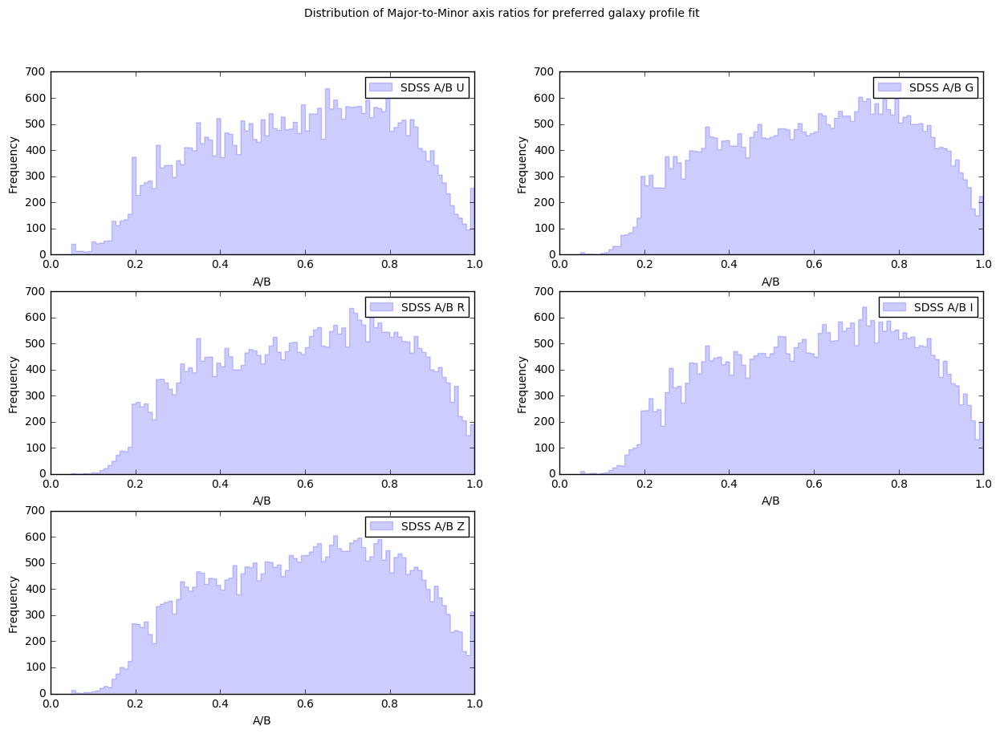

In [77]:
gc.collect()

abRatioDistFigure = plt.figure(figsize=(15, 10))
abRatioDistFigure.suptitle('Distribution of Major-to-Minor axis ratios for preferred galaxy profile fit')

for index, filterName in enumerate('ugriz') :
    subplotAxis = plt.subplot(3, 2, index+1)
    sdssResult['preferredAB_' + filterName].plot.hist(bins=100, histtype='step', fill=True, alpha=0.2)
    lines, labels = subplotAxis.get_legend_handles_labels()
    labels = ['SDSS A/B ' + str(filterName.upper())]
    subplotAxis.legend(lines[:1], labels[:1], loc='best',fontsize='medium')
    plt.xlabel("A/B")

### Plot a random sample of cutout images for likely edge-on (A/B$\rightarrow$0) and face-on (A/B$\rightarrow$1) galaxies
#### Edge on first
Use A/B < 0.3 as the selection criterion

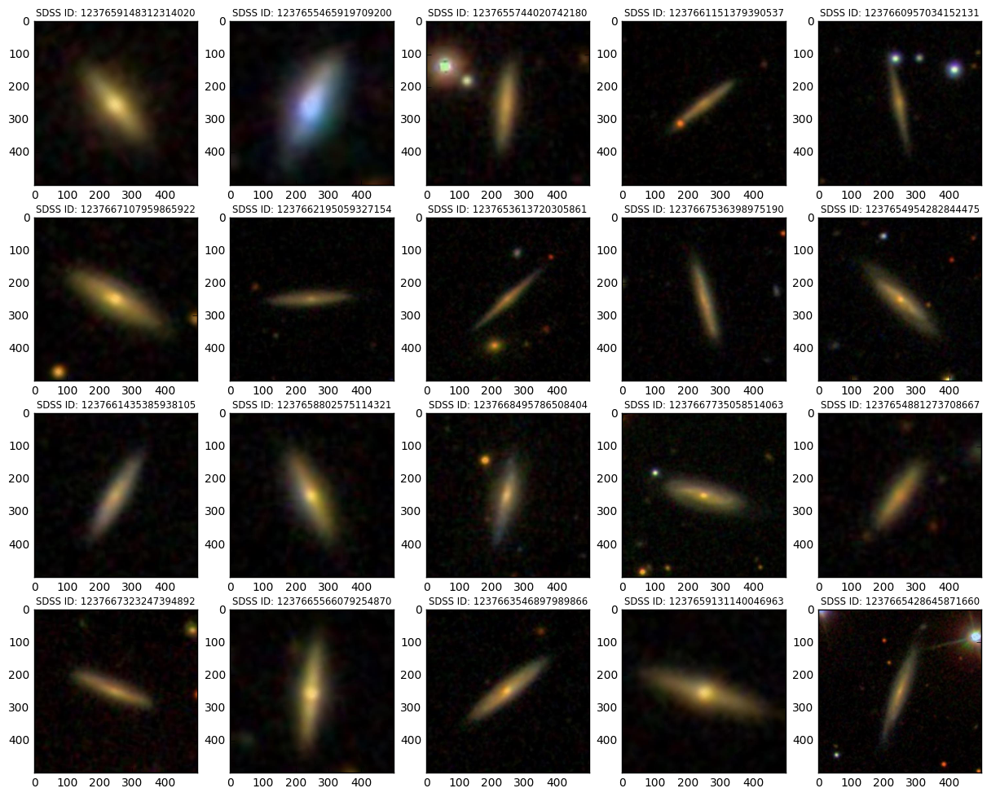

In [78]:
width=500
height=500
pixelsize=0.396 # SDSS pixel scale?
subPlotNum = 1
abRatioCut = sdssResult['preferredAB_g'] < 0.3

plt.figure(figsize=(15, 15))

for index, galData in sdssResult[abRatioCut].sample(20).iterrows():
    # the 'scale' parameter is set so that the image will be about 2x the size of the galaxy
    scale=2.0*galData['petror90_r']/pixelsize/width
    # form wurl to query SDSS web sevice to generate cutout image
    cutOutImageUrl="http://skyservice.pha.jhu.edu/DR12/ImgCutout/getjpeg.aspx?ra=" + str(galData['ra'])
    cutOutImageUrl += "&dec=" + str(galData['dec']) + "&scale=""" + str(scale) + "&width=" + str(width)
    cutOutImageUrl += "&height=" + str(height)
    # retrieve 
    cutoutImage=skimage.io.imread(cutOutImageUrl)
    plt.subplot(5,5,subPlotNum)
    subPlotNum += 1
    plt.imshow(cutoutImage)
    # show the object identifier (objId) above the image.
    plt.title('SDSS ID: ' + str(galData['dr8objid']), size='small')

#### Now face-on
Use A/B > 0.7 as the selection criterion

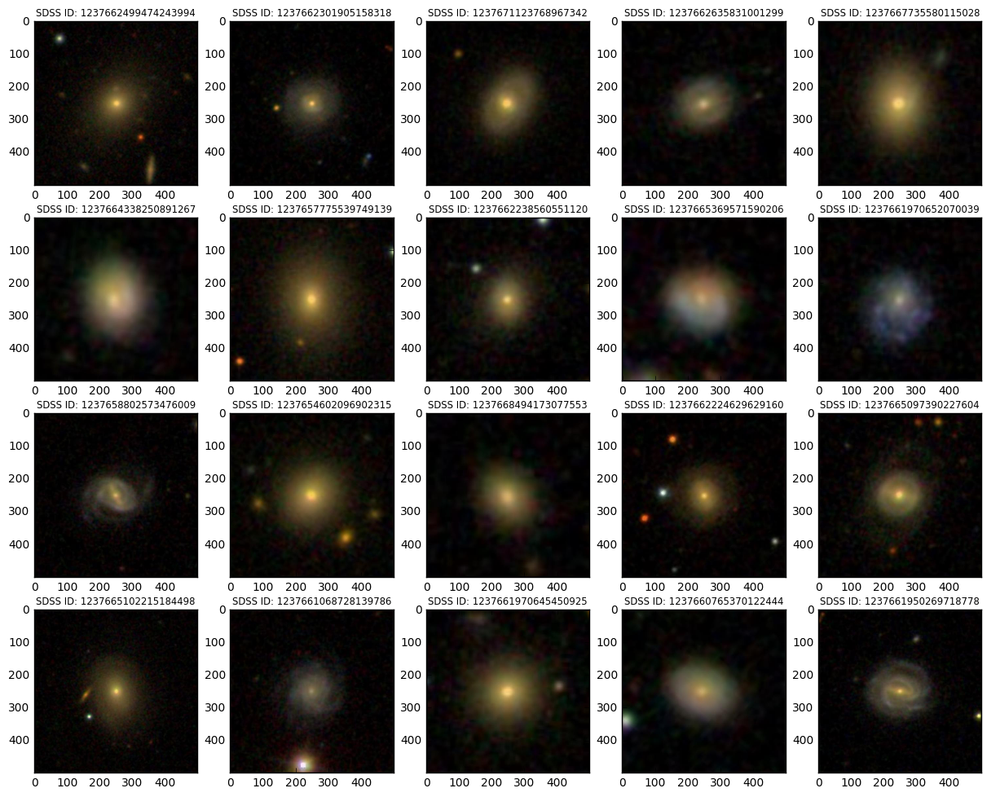

In [79]:
width=500
height=500
pixelsize=0.396 # SDSS pixel scale?
subPlotNum = 1
abRatioCut = sdssResult['preferredAB_g'] > 0.7

plt.figure(figsize=(15, 15))

for index, galData in sdssResult[abRatioCut].sample(20).iterrows():
    # the 'scale' parameter is set so that the image will be about 2x the size of the galaxy
    scale=2.0*galData['petror90_r']/pixelsize/width
    # form wurl to query SDSS web sevice to generate cutout image
    cutOutImageUrl="http://skyservice.pha.jhu.edu/DR12/ImgCutout/getjpeg.aspx?ra=" + str(galData['ra'])
    cutOutImageUrl += "&dec=" + str(galData['dec']) + "&scale=""" + str(scale) + "&width=" + str(width)
    cutOutImageUrl += "&height=" + str(height)
    # retrieve 
    cutoutImage=skimage.io.imread(cutOutImageUrl)
    plt.subplot(5,5,subPlotNum)
    subPlotNum += 1
    plt.imshow(cutoutImage)
    # show the object identifier (objId) above the image.
    plt.title('SDSS ID: ' + str(galData['dr8objid']), size='small')

### Now plot A/B versus vote fractions for edge_on and not_edge_on 

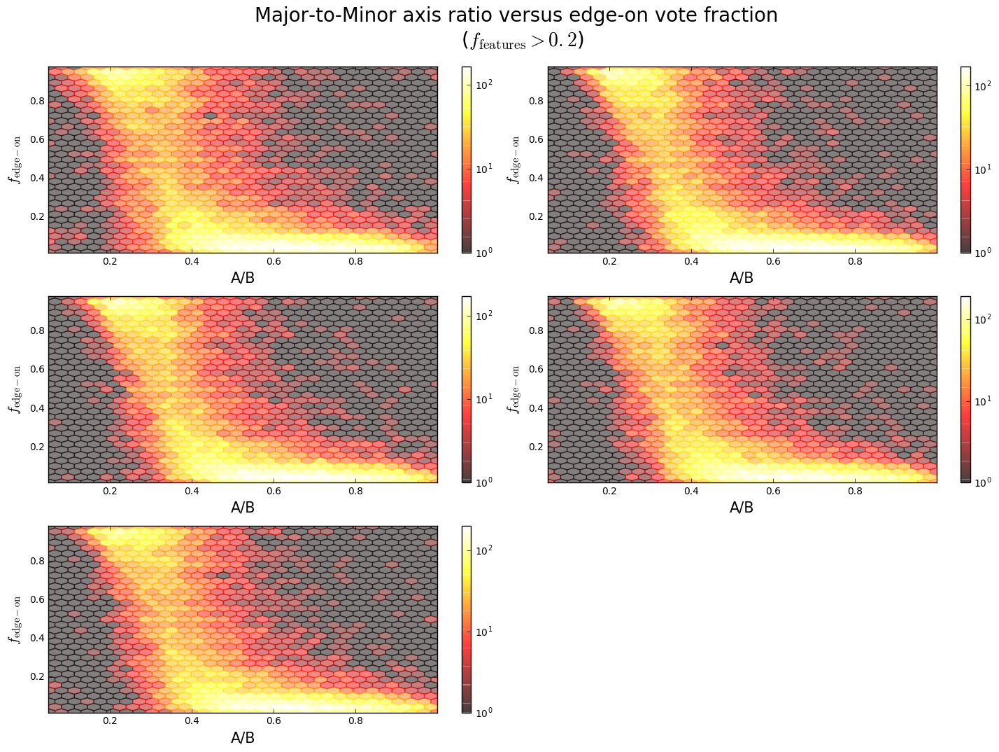

In [219]:
gc.collect()

abRatioDistFigure = plt.figure(figsize=(15, 10))

for index, filterName in enumerate('ugriz') :
    subplotAxis = plt.subplot(3, 2, index+1)
    cut = (sdssResult['t01_smooth_or_features_a02_features_or_disk_fraction'] > 0.2) & (sdssResult['t02_edgeon_a04_yes_fraction'] > 0) & (sdssResult['t02_edgeon_a04_yes_fraction'] < 1)
    sdssResult[cut].dropna().plot.hexbin(ax=subplotAxis, x='preferredAB_' + filterName, y='t02_edgeon_a04_yes_fraction', gridsize=30, cmap='hot', alpha=0.5, label='SDSS ' + str(filterName.upper()), sharex=False, norm=matplotlib.colors.LogNorm())
    plt.xlabel(r"A/B", size=15)
    plt.ylabel(r"$f_{\rm edge-on}$", size=15)
    plt.tight_layout()

abRatioDistFigure.suptitle('Major-to-Minor axis ratio versus edge-on vote fraction \n ($f_{\\rm features} > 0.2$)', y=1.07, size=20)

## Direct comparison between SDSS and Illustris GZ Sample Mass Distributions

Comparison between the distribution of subhalo **stellar** masses from the GZ Illustris sample and the distributions of estimated **stellar** masses contained within the 50%, 84% and 97.5% **Petrosian** radii (denoted $R_{50}$, $R_{84}$, and $R_{97.5}$ on the plotted distribution axes) of the entire Galaxy Zoo II SDSS sample.

**Note**: Change the subsequent variables to restrict sampling to a particular subset of the Galaxy Zoo dataset.

In [81]:
gzSampleSubset = 'fixed_view_and_first_fixed_mass'
gzSampleSubsetForVoteFrac = lambda dataset : (dataset['priority'] == 'fixed_view') | (dataset['priority'] == 'first_fixed_mass')

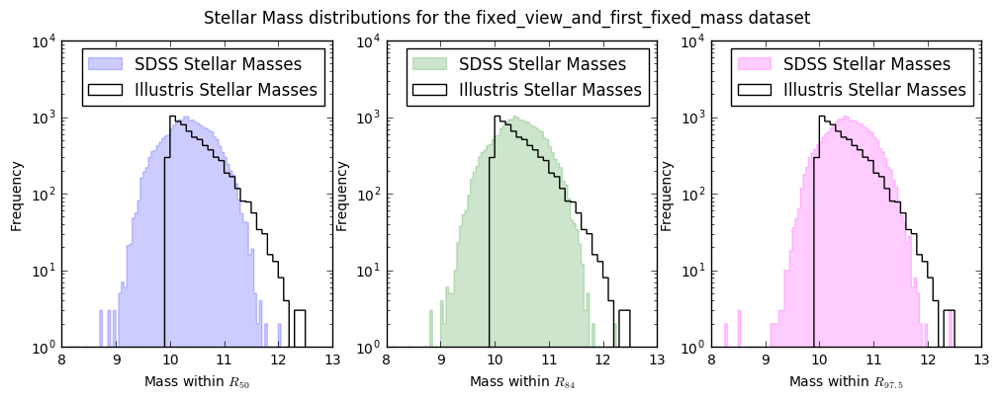

In [82]:
gc.collect()
massCompSloanIlustrisPlots=plt.figure(figsize=(12, 4))

massCompSloanIlustrisPlots.suptitle('Stellar Mass distributions for the ' + gzSampleSubset + ' dataset', fontsize=12)

p50axes = massCompSloanIlustrisPlots.add_subplot(1,3,1)
p84axes = massCompSloanIlustrisPlots.add_subplot(1,3,2)
p97p5axes = massCompSloanIlustrisPlots.add_subplot(1,3,3)

sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p50'] > -100)]['lgm_tot_p50'].plot.hist(ax=p50axes, histtype='step', color='b', fill=True, fc='b', alpha=0.2, logy=True, bins=100, range=(8,13))
p50axes.set_xlabel(r'Mass within $R_{50}$')
sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p84'] > -100)]['lgm_tot_p84'].plot.hist(ax=p84axes, histtype='step', color='g', fill=True, fc='g', alpha=0.2, logy=True, bins=100, range=(8,13))
p84axes.set_xlabel(r'Mass within $R_{84}$')
sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p97p5'] > -100)]['lgm_tot_p97p5'].plot.hist(ax=p97p5axes, histtype='step', color='magenta', fill=True, fc='magenta', alpha=0.2, logy=True, bins=100, range=(8,13))
p97p5axes.set_xlabel(r'Mass within $R_{97.5}$')

illustrisStellarMasses[gzSampleSubset].plot.hist(ax=p50axes, histtype='step', bins=50, range=(8,13), logy=True, alpha=1, color='k')
illustrisStellarMasses[gzSampleSubset].plot.hist(ax=p84axes, histtype='step', bins=50, range=(8,13), logy=True, alpha=1, color='k')
illustrisStellarMasses[gzSampleSubset].plot.hist(ax=p97p5axes, histtype='step', bins=50, range=(8,13), logy=True, alpha=1, color='k')

lines, labels = p50axes.get_legend_handles_labels()
labels = [ 'SDSS Stellar Masses', 'Illustris Stellar Masses']
p50axes.legend(lines, labels)

lines, labels = p84axes.get_legend_handles_labels()
labels = [ 'SDSS Stellar Masses', 'Illustris Stellar Masses']
p84axes.legend(lines, labels)

lines, labels = p97p5axes.get_legend_handles_labels()
labels = [ 'SDSS Stellar Masses', 'Illustris Stellar Masses']
p97p5axes.legend(lines, labels)

## Isolated plot of the raw distributions for $R_{97.5}$

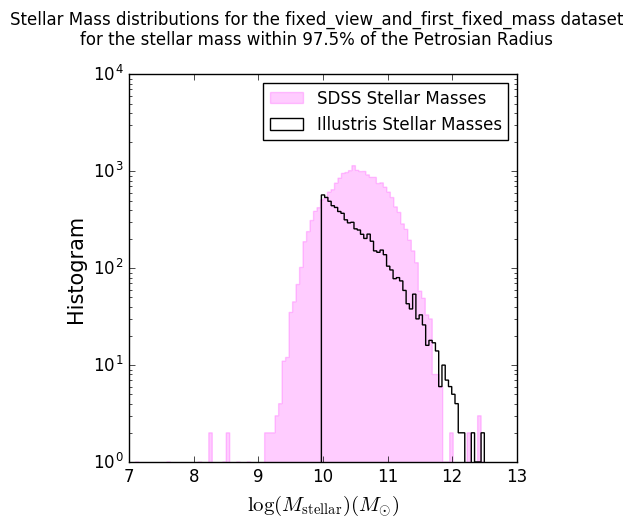

In [83]:
gc.collect()
stellarMassDistFigure = plt.figure(figsize=(5,5))
stellarMassDistFigure.suptitle('Stellar Mass distributions for the ' + gzSampleSubset + ' dataset\nfor the stellar mass within 97.5% of the Petrosian Radius', fontsize=12, y=1.03)
sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p97p5'] > -100)]['lgm_tot_p97p5'].plot.hist(ax=stellarMassDistFigure.gca(), histtype='step', fill=True, alpha=0.2, fc='magenta', color='magenta', logy=True, bins=100)
illustrisStellarMasses[gzSampleSubset].plot.hist(ax=stellarMassDistFigure.gca(), histtype='step', bins=50, logy=True, alpha=1, color='k')
stellarMassDistFigure.gca().set_xlabel(r'$\log(M_{\rm stellar}) (M_{\odot})$', fontsize=15)
stellarMassDistFigure.gca().set_ylabel(r'Histogram', fontsize=15)
stellarMassDistFigure.gca().tick_params(labelsize=12)

lines, labels = stellarMassDistFigure.gca().get_legend_handles_labels()
labels = [ 'SDSS Stellar Masses', 'Illustris Stellar Masses']
stellarMassDistFigure.gca().legend(lines, labels)

## Bootstrap from the Illustris sample to match the *mass* distribution of the SDSS dataset
Randomly resample from the Illustris sample to match the SDSS mass distribution for $M>10^{10}\,{\rm M_{\odot}}$.

In [242]:
class BootStrapper() :
    
    def __init__(self, 
                 targetDistData, 
                 sampleDistData, 
                 numBins, 
                 targetColumnName, 
                 sampleColumnName, 
                 rejectionEfficiency=10) :
        
        self.distData = {'target' : targetDistData if isinstance(targetDistData, pd.DataFrame) else None, 
                         'sample' : sampleDistData if isinstance(sampleDistData, pd.DataFrame) else None }
        
        self.columnName = {'target' : targetColumnName if isinstance(targetColumnName, str) else None, 
                           'sample' : sampleColumnName if isinstance(sampleColumnName, str) else targetColumnName } 
        
        self.distHisto = {'target' : None, 'sample' : None}
        self.distHistoBins = {'target' : None, 'sample' : numBins if isinstance(numBins, int) else None }
        
        self.distFrame = {'target' : None, 'sample' : None}
        self.distSpline = {'target' : None, 'sample' : None}
                
        self.pdfFrameColNames = ['density', 'bin_low_edge', 'bin_high_edge', 'bin_centre']
        
        self.resampledDistFrame = None
        
        self.rejectionEfficiency = rejectionEfficiency
    
    def genProbDist(self, key) :
        print ('Generating probability disribution for {}...'.format(key))
        self.distHisto[key] = np.histogram(self.distData[key][self.columnName[key]].values, 
                                           bins=self.distHistoBins[key], 
                                           density = True)
        self.distFrame[key] = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(self.distHisto[key][0], self.distHisto[key][1][0:-1], self.distHisto[key][1][1:])], 
                                            columns=self.pdfFrameColNames)
        self.distSpline[key] = scipy.interpolate.UnivariateSpline(self.distFrame[key]['bin_centre'].values, self.distFrame[key]['density'].values, s=0)
        if key == 'sample' :
            self.distHistoBins['target'] = self.distHisto[key][1]

    def genResampledDistribution(self) :
        print ('Generating resampled distribution...')
        while len(self.resampledDistFrame.index) < len(self.distData['target'].index) :
            # select a random sample of rows from the illustris dataset (select more than we need)
            fullSample = self.distData['sample'].sample(1000)
            # generate the same number of random uniform variates
            uniformVariates = np.random.uniform(size=1000)
            # generate pdf values for the stellar masses corresponding to each of the samples
            targetPdfVals = self.distSpline['target'](fullSample[self.columnName['sample']])
            samplePdfVals = self.distSpline['sample'](fullSample[self.columnName['sample']])
            pdfRatioVals = targetPdfVals/(self.rejectionEfficiency*samplePdfVals)
            # select only those rows of the sample that fulfil the acceptance criterion
            filteredSample = fullSample[uniformVariates <= pdfRatioVals]
            self.resampledDistFrame = pd.concat([self.resampledDistFrame,filteredSample], ignore_index=True)
        print ('Done.')

    def getResampledDataset(self) :
        # initialization of probability distributions
        for key in ['sample', 'target'] :
            if self.distData[key] is not None and self.columnName[key] is not None and self.distHistoBins[key] is not None :
                self.genProbDist(key)
        # initialization of output resampled distribution
        self.resampledDistFrame = pd.DataFrame(columns=self.distData['target'].columns)
        self.genResampledDistribution()
        return self.resampledDistFrame
        

In [84]:
# histogram the distributions (specifying density=True produces histograms with unit integral i.e.e PDFs) 
illustrisHist = np.histogram(illustrisStellarMasses[gzSampleSubset].values,bins=100, density=True)
sdss50Sample = sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p50'] > 10)]['lgm_tot_p50']
sdssHist50 = np.histogram(sdss50Sample.values,bins=illustrisHist[1], density = True)
sdss84Sample = sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p84'] > 10)]['lgm_tot_p84']
sdssHist84 = np.histogram(sdss84Sample.values, bins=illustrisHist[1], density = True)
sdss97p5Sample = sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p97p5'] > 10)]['lgm_tot_p97p5']
sdssHist97p5 = np.histogram(sdss97p5Sample.values,bins=illustrisHist[1], density = True)

# copy data into dataframes for plotting and manipulation etc.
pdfHistColNames = ['density', 'bin_low_edge', 'bin_high_edge', 'bin_centre']
pdfIllustrisFrame = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(illustrisHist[0], illustrisHist[1][0:-1], illustrisHist[1][1:])], columns=pdfHistColNames)
pdfHist50Frame = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(sdssHist50[0], illustrisHist[1][0:-1], illustrisHist[1][1:])], columns=pdfHistColNames)
pdfHist84Frame = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(sdssHist84[0], illustrisHist[1][0:-1], illustrisHist[1][1:])], columns=pdfHistColNames)
pdfHist97p5Frame = pd.DataFrame([(*zipped, 0.5*(zipped[1]+zipped[2])) for zipped in zip(sdssHist97p5[0], illustrisHist[1][0:-1], illustrisHist[1][1:])], columns=pdfHistColNames)

# use rejection sampling to bootstrap a sample from the illustris data that replicates the distribution of SDSS masses
illustrisPdfSpline = scipy.interpolate.UnivariateSpline(pdfIllustrisFrame['bin_centre'].values, pdfIllustrisFrame['density'].values, s=0)
hist50PdfSpline = scipy.interpolate.UnivariateSpline(pdfHist50Frame['bin_centre'].values, pdfHist50Frame['density'].values, s=0)
hist84PdfSpline = scipy.interpolate.UnivariateSpline(pdfHist84Frame['bin_centre'].values, pdfHist84Frame['density'].values, s=0)
hist97p5PdfSpline = scipy.interpolate.UnivariateSpline(pdfHist97p5Frame['bin_centre'].values, pdfHist97p5Frame['density'].values, s=0)

bootstrapPdf50IllustrisFrame = pd.DataFrame(columns=finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].columns)
bootstrapPdf84IllustrisFrame = pd.DataFrame(columns=finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].columns)
bootstrapPdf97p5IllustrisFrame = pd.DataFrame(columns=finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].columns)

rejectionEfficiency = 11

while len(bootstrapPdf50IllustrisFrame.index) < len(sdss50Sample.index) :
    # select a random sample of rows from the illustris dataset (select more than we need)
    fullSample = finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].sample(1000)
    # generate the same number of random uniform variates
    uniformVariates = np.random.uniform(size=1000)
    # generate pdf values for the stellar masses corresponding to each of the samples
    hist50PdfVals = hist50PdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    illustrisPdfVals = illustrisPdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    pdfRatioVals = hist50PdfVals/(rejectionEfficiency*illustrisPdfVals)
    # select only those rows of the sample that fulfil the acceptance criterion
    filteredSample = fullSample[uniformVariates <= pdfRatioVals]
    bootstrapPdf50IllustrisFrame = pd.concat([bootstrapPdf50IllustrisFrame,filteredSample], ignore_index=True)
    
while len(bootstrapPdf84IllustrisFrame.index) < len(sdss84Sample.index) :
    # select a random sample of rows from the illustris dataset (select more than we need)
    fullSample = finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].sample(1000)
    # generate the same number of random uniform variates
    uniformVariates = np.random.uniform(size=1000)
    # generate pdf values for the stellar masses corresponding to each of the samples
    hist84PdfVals = hist84PdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    illustrisPdfVals = illustrisPdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    pdfRatioVals = hist84PdfVals/(rejectionEfficiency*illustrisPdfVals)
    # select only those rows of the sample that fulfil the acceptance criterion
    filteredSample = fullSample[uniformVariates <= pdfRatioVals]
    bootstrapPdf84IllustrisFrame = pd.concat([bootstrapPdf84IllustrisFrame,filteredSample], ignore_index=True)
    
while len(bootstrapPdf97p5IllustrisFrame.index) < len(sdss97p5Sample.index) :
    # select a random sample of rows from the illustris dataset (select more than we need)
    fullSample = finalIllustris1RedshiftZeroSubHaloDataFrames[gzSampleSubset].sample(1000)
    # generate the same number of random uniform variates
    uniformVariates = np.random.uniform(size=1000)
    # generate pdf values for the stellar masses corresponding to each of the samples
    hist97p5PdfVals = hist97p5PdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    illustrisPdfVals = illustrisPdfSpline(np.log10(10**10*fullSample["mass_stars"]/hubbleH))
    pdfRatioVals = hist97p5PdfVals/(rejectionEfficiency*illustrisPdfVals)
    # select only those rows of the sample that fulfil the acceptance criterion
    filteredSample = fullSample[uniformVariates <= pdfRatioVals]
    bootstrapPdf97p5IllustrisFrame = pd.concat([bootstrapPdf97p5IllustrisFrame,filteredSample], ignore_index=True)

## *Aside:* Plot PDFs for SDSS Masses within each radial limit

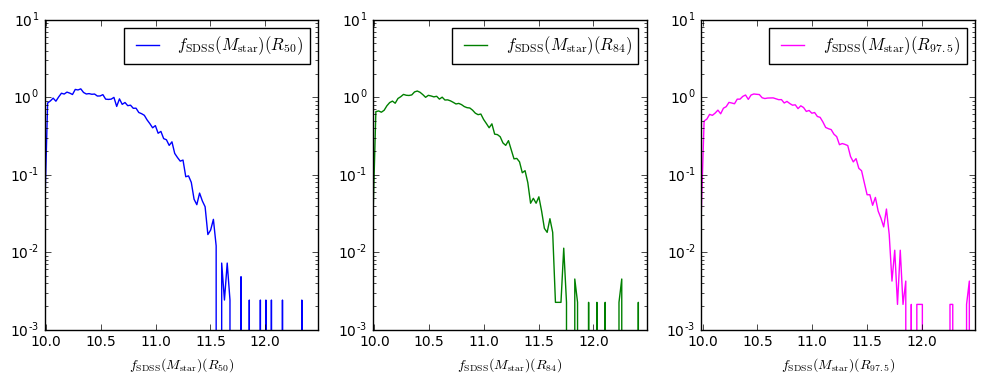

In [85]:
normalizedMassCompSloanIlustrisPlots=plt.figure(figsize=(12, 4))

p50axesNorm = normalizedMassCompSloanIlustrisPlots.add_subplot(1,3,1)
p84axesNorm = normalizedMassCompSloanIlustrisPlots.add_subplot(1,3,2)
p97p5axesNorm = normalizedMassCompSloanIlustrisPlots.add_subplot(1,3,3)

pdfHist50Frame.plot.line(x='bin_centre', y='density', ax = p50axesNorm, color='b', logy=True, label=r'$f_{\rm SDSS}(M_{\rm star}) (R_{50})$')
p50axesNorm.set_xlabel(r'$f_{\rm SDSS}(M_{\rm star}) (R_{50})$')
pdfHist84Frame.plot.line(x='bin_centre', y='density',ax = p84axesNorm, color='g', logy=True, label=r'$f_{\rm SDSS}(M_{\rm star}) (R_{84})$')
p84axesNorm.set_xlabel(r'$f_{\rm SDSS}(M_{\rm star}) (R_{84})$')
pdfHist97p5Frame.plot.line(x='bin_centre', y='density',ax = p97p5axesNorm, color='magenta', logy=True, label=r'$f_{\rm SDSS}(M_{\rm star}) (R_{97.5})$')
p97p5axesNorm.set_xlabel(r'$f_{\rm SDSS}(M_{\rm star}) (R_{97.5})$')

## Overplot the boostrapped distributions and their target distributions

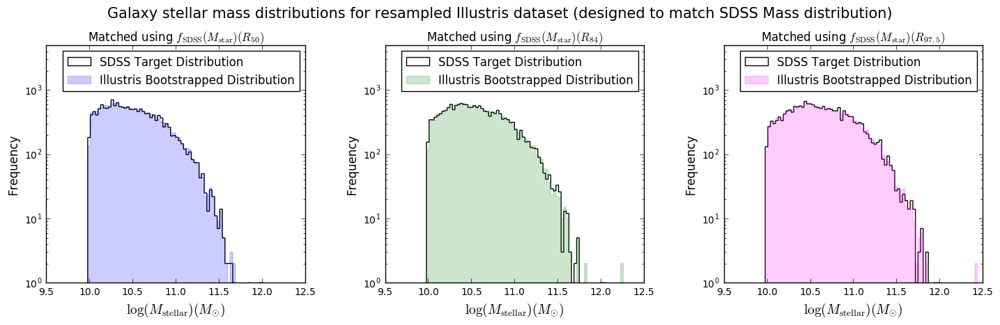

In [86]:
gc.collect()
bootstrapMassCompSloanIlustrisPlots=plt.figure(figsize=(15, 5))
bootstrapMassCompSloanIlustrisPlots.suptitle(r'Galaxy stellar mass distributions for resampled Illustris dataset (designed to match SDSS Mass distribution)', size=15)

for index, dataset in enumerate([(bootstrapPdf50IllustrisFrame, sdss50Sample, 50, 'b'),
                               (bootstrapPdf84IllustrisFrame, sdss84Sample, 84, 'g'),
                               (bootstrapPdf97p5IllustrisFrame, sdss97p5Sample, 97.5, 'magenta')]) :

    bootStrapAxes = bootstrapMassCompSloanIlustrisPlots.add_subplot(1,3,index + 1)

    logStellarMasses = np.log10(10**10*dataset[0]["mass_stars"]/hubbleH)

    logStellarMasses.plot.hist(ax=bootStrapAxes, histtype='step', color='k', fill=False, logy=True, bins=100, range=(9.5, 12.5), title='Matched using ' + r'$f_{\rm SDSS}(M_{\rm star}) (R_{' + str(dataset[2]) + r'})$')
    dataset[1].plot.hist(ax=bootStrapAxes, histtype='step', color=dataset[3], fill=True, alpha=0.2, logy=True, bins=100, range=(9.5, 12.5), fc=dataset[3])
    plt.xlabel(r'$\log(M_{\rm stellar}) (M_{\odot})$', fontsize=14)
    plt.ylabel(r'Frequency', fontsize=12)
    plt.ylim(1, 5e3)
    lines, labels = bootStrapAxes.get_legend_handles_labels()
    labels = [ 'SDSS Target Distribution', 'Illustris Bootstrapped Distribution']
    bootStrapAxes.legend(lines, labels)

plt.tight_layout(pad=3)

## Isolated plot of the bootstrapped distributions for $R_{97.5}$

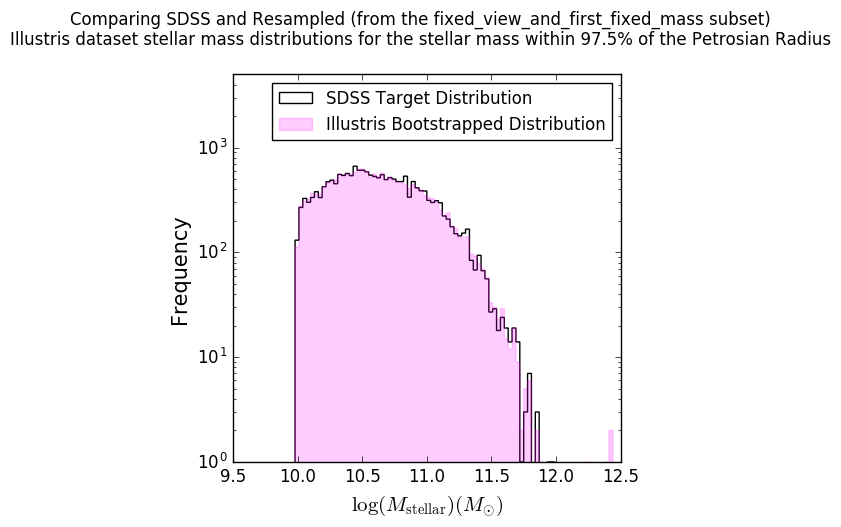

In [173]:
gc.collect()
stellarMassDistFigure = plt.figure(figsize=(5,5))
stellarMassDistFigure.suptitle('Comparing SDSS and Resampled (from the ' + gzSampleSubset + ' subset)\nIllustris dataset stellar mass distributions for the stellar mass within 97.5% of the Petrosian Radius', fontsize=12, y=1.03)
logStellarMasses = np.log10(10**10*bootstrapPdf97p5IllustrisFrame["mass_stars"]/hubbleH)
logStellarMasses.plot.hist(ax=stellarMassDistFigure.gca(), histtype='step', color='k', fill=False, logy=True, bins=100, range=(9.5, 12.5))
sdss97p5Sample.plot.hist(ax=stellarMassDistFigure.gca(), histtype='step', color='magenta', fill=True, alpha=0.2, fc='magenta', logy=True, bins=100, range=(9.5, 12.5))
stellarMassDistFigure.gca().set_xlabel(r'$\log(M_{\rm stellar}) (M_{\odot})$', fontsize=15)
stellarMassDistFigure.gca().set_ylabel(r'Frequency', fontsize=15)
stellarMassDistFigure.gca().tick_params(labelsize=12)
plt.ylim(1, 5e3)
lines, labels = stellarMassDistFigure.gca().get_legend_handles_labels()
labels = [ 'SDSS Target Distribution', 'Illustris Bootstrapped Distribution']
stellarMassDistFigure.gca().legend(lines, labels)

## Plot the distributions of Vote fraction for the resampled datasets

In [171]:
bootstrapPdf50IllustrisFrameWithVotes = bootstrapPdf50IllustrisFrame.merge(galaxyPropertiesIllustrisWithUrlFrame.drop_duplicates(), how='left', right_index=True, left_on='id', suffixes=['', '_url'])
bootstrapPdf84IllustrisFrameWithVotes = bootstrapPdf84IllustrisFrame.merge(galaxyPropertiesIllustrisWithUrlFrame.drop_duplicates(), how='left', right_index=True, left_on='id', suffixes=['', '_url'])
bootstrapPdf97p5IllustrisFrameWithVotes = bootstrapPdf97p5IllustrisFrame.merge(galaxyPropertiesIllustrisWithUrlFrame.drop_duplicates(), how='left', right_index=True, left_on='id', suffixes=['', '_url'])

In [125]:
finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes = {}
for key, frame in finalIllustris1RedshiftZeroSubHaloDataFrames.items() :
    finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes.update({key : frame.merge(galaxyPropertiesIllustrisWithUrlFrame.drop_duplicates(), how='left', right_index=True, left_on='id', suffixes=['', '_url'])})
# Check that merging didn't add any extra rows!
print (len(finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_view_and_first_fixed_mass'].index))

7568


In [278]:
dataFrameWithStellarMass = finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes[gzSampleSubset]
dataFrameWithStellarMass['mass_stars_natural_units'] = np.log10(10**10*dataFrameWithStellarMass["mass_stars"]/hubbleH)

sdssSampleFrame = sdssResult[np.logical_and(np.logical_and(sdssResult['z'] > 0.045, sdssResult['z'] < 0.055), sdssResult['lgm_tot_p97p5'] > 10)]

bootStrapper = SimpleAcceptReject(dataFrameWithStellarMass,
                            sdssSampleFrame,
                            100, 
                            'mass_stars_natural_units',
                            'lgm_tot_p97p5')

resampledFrame = bootStrapper.getResampledDataset()

Generating probability disribution for sample...
Generating probability disribution for target...
Generating resampled distribution...
Done.


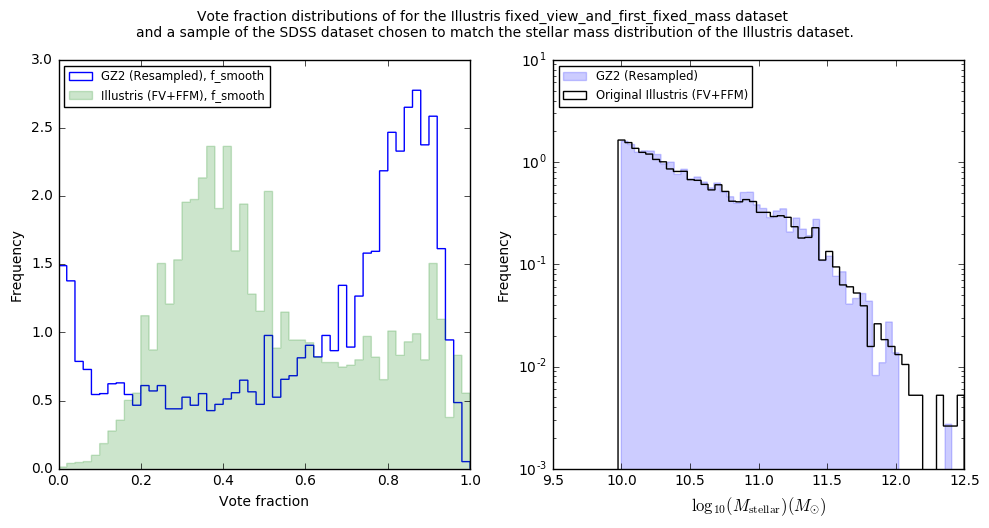

In [305]:
gc.collect()

sdssResampleFigure = plt.figure(figsize=(10,5))
sdssResampleFigure.suptitle("Vote fraction distributions of for the Illustris fixed_view_and_first_fixed_mass dataset \nand a sample of the SDSS dataset chosen to match the stellar mass distribution of the Illustris dataset.", y=1.05)

sdssResampleAxes = plt.subplot(1,2,1)
resampledFrame['t01_smooth_or_features_a01_smooth_fraction'].plot.hist(ax=sdssResampleAxes, bins=50, histtype='step', logy=False, fill=False, normed=True)
dataFrameWithStellarMass['p_smooth'].plot.hist(ax=sdssResampleAxes, bins=50, histtype='step', logy=False, fill=True, alpha=0.2, normed=True)
sdssResampleAxes.set_xlabel('Vote fraction')

lines, labels = sdssResampleAxes.get_legend_handles_labels()
labels = [ 'GZ2 (Resampled), f_smooth', 'Illustris (FV+FFM), f_smooth' ]
sdssResampleAxes.legend(lines[:2], labels[:2], loc='upper left', fontsize='small')

sdssDistMatchAxes = plt.subplot(1,2,2)
resampledFrame['lgm_tot_p97p5'].plot.hist(ax=sdssDistMatchAxes, bins=50, histtype='step', logy=True, fill=True, alpha=0.2, normed=True)
dataFrameWithStellarMass['mass_stars_natural_units'].plot.hist(ax=sdssDistMatchAxes, bins=50, histtype='step', logy=True, fill=False, ec='k', normed=True)

lines, labels = sdssDistMatchAxes.get_legend_handles_labels()
labels = [ 'GZ2 (Resampled)', 'Original Illustris (FV+FFM)' ]
sdssDistMatchAxes.legend(lines[:2], labels[:2], loc='upper left', fontsize='small')
sdssDistMatchAxes.set_xlabel(r'$\log_{10}(M_{\rm stellar}) (M_{\odot})$', fontsize=12)

plt.tight_layout()

4362 4168
3066 2866
189 209


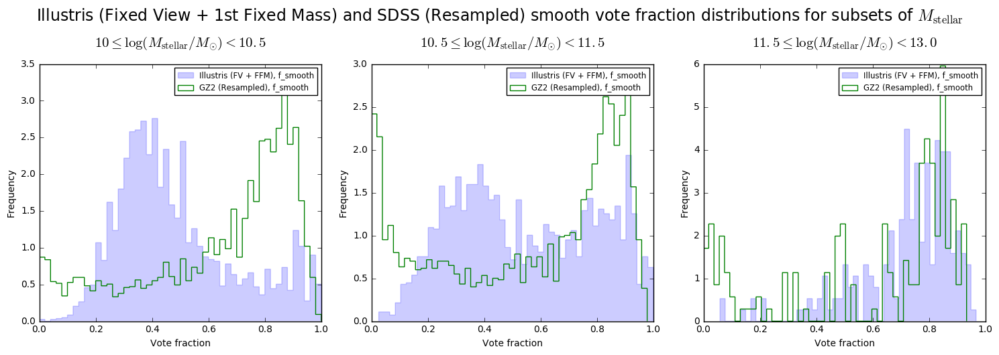

In [314]:
gc.collect()
stellarMassRanges = [ [10, 10.5], [10.5, 11.5], [11.5, 13.0] ] # Units are log_10(solar mass)

slicedVoteFracFigure = plt.figure(figsize=(5*len(stellarMassRanges), 5))

for rangeIndex, stellarMassRange in enumerate(stellarMassRanges) :
    subPlotAxis = plt.subplot(100 + 10*len(stellarMassRanges) + rangeIndex + 1)
    IllustrisCut = ((dataFrameWithStellarMass['mass_stars_natural_units'] >= stellarMassRange[0]) & (dataFrameWithStellarMass['mass_stars_natural_units'] < stellarMassRange[1])) 
    sdssCut = ((resampledFrame['lgm_tot_p97p5'] >= stellarMassRange[0]) & (resampledFrame['lgm_tot_p97p5'] < stellarMassRange[1])) 
    #dataFrameWithStellarMass[cut][['p_smooth','p_features']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', fill=True, alpha=0.2, normed=True)
    dataFrameWithStellarMass[IllustrisCut][['p_smooth']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', fill=True, alpha=0.2, normed=True)
    subPlotAxis.set_title(r'${}\leq \log(M_{}/M_{}) < {}$'.format(stellarMassRange[0], r'{\rm stellar}', r'{\odot}', stellarMassRange[1]), size=15, y=1.05)
    subPlotAxis.set_xlabel('Vote fraction')
    #sdssResult[['t01_smooth_or_features_a01_smooth_fraction', 't01_smooth_or_features_a02_features_or_disk_fraction']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', logy=False, fill=False, normed=True)
    resampledFrame[sdssCut][['t01_smooth_or_features_a01_smooth_fraction']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', logy=False, fill=False, normed=True)
    lines, labels = subPlotAxis.get_legend_handles_labels()
    labels = [r'Illustris (FV + FFM), f_smooth', 'GZ2 (Resampled), f_smooth']
    subPlotAxis.legend(lines[:2], labels[:2], loc='best', fontsize='small')
    print(len(resampledFrame[sdssCut].index), len(dataFrameWithStellarMass[IllustrisCut].index))

plt.suptitle(r'Illustris (Fixed View + 1st Fixed Mass) and SDSS (Resampled) smooth vote fraction distributions for subsets of $M_{\rm stellar}$', y=1.05, size=17)
plt.tight_layout()

###  Illustris vote fraction distributions for the fiducial data selection specified by `gzSampleSubsetForVoteFrac` 
Note that `gzSampleSubsetForVoteFrac` is a **`lambda`** and is currently (or at least at the time of writing, check above to be sure!) defined as:
```python
gzSampleSubsetForVoteFrac = lambda dataset : (dataset['priority'] == 'fixed_view') | (dataset['priority'] == 'first_fixed_mass')
```
This is equivalent to the `fixed_view_and_first_fixed_mass` criterion.

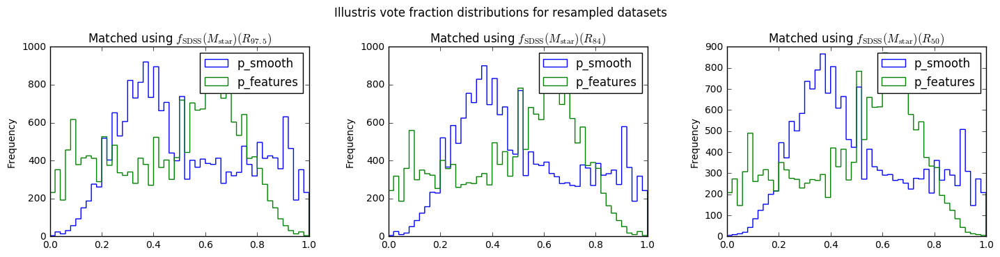

In [172]:
gc.collect()

bootstrapSmoothFeatureCompSloanIlustrisFigure = plt.figure(figsize=(15, 4))
plt.suptitle('Illustris vote fraction distributions for resampled datasets', size=12)
for index, dataset in enumerate([(bootstrapPdf97p5IllustrisFrameWithVotes[gzSampleSubsetForVoteFrac(bootstrapPdf97p5IllustrisFrameWithVotes)], 97.5), 
                                 (bootstrapPdf84IllustrisFrameWithVotes[gzSampleSubsetForVoteFrac(bootstrapPdf84IllustrisFrameWithVotes)], 84), 
                                 (bootstrapPdf50IllustrisFrameWithVotes[gzSampleSubsetForVoteFrac(bootstrapPdf50IllustrisFrameWithVotes)], 50)]) :
    subplotAxis = plt.subplot(1,3,index+1)
    dataset[0][['p_smooth','p_features']].plot.hist(ax=subplotAxis, bins=50, histtype='step', logy=False, fill=False, title='Matched using ' + r'$f_{\rm SDSS}(M_{\rm star}) (R_{' + str(dataset[1]) + r'})$')
plt.tight_layout(pad=3)

## Vote fractions for various subsets of the *raw* Illustris data *without* mass matching
###  Illustris vote fraction distributions for the `fixed_mass` data sample

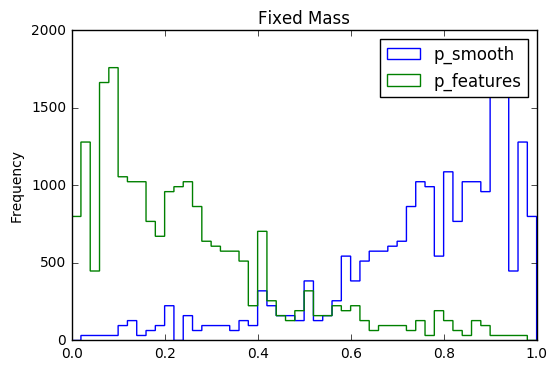

In [127]:
fixedMassVoteFracFig = plt.figure(figsize=(15, 15))
plt.suptitle('Illustris vote fraction distributions for resampled datasets', size=12)
for index, dataset in enumerate([(finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_mass'])]) :
    dataset[['p_smooth','p_features']].plot.hist(bins=50, histtype='step', logy=False, fill=False, title='Fixed Mass')

###  Illustris vote fraction distributions for the lower ($10.5 \le \log_{10}(\frac{h\cdot M_{\rm subhalo}^{\rm total}}{\rm 10 \cdot M_{\odot}}) \le 11$) `fixed_mass` data sample

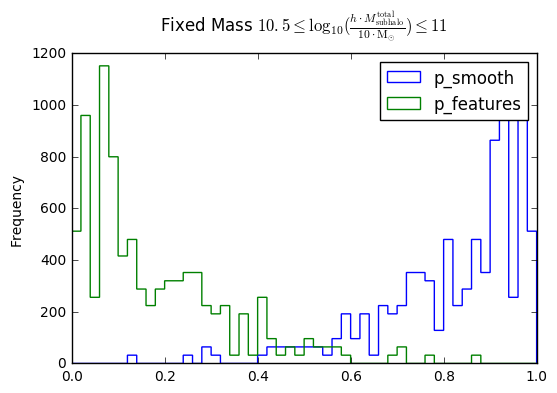

In [128]:
gc.collect()
fixedMassVoteFracFig = plt.figure(figsize=(15, 15))
plt.suptitle('Illustris vote fraction distributions for resampled datasets', size=12)
for index, dataset in enumerate([(finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_mass'])]) :
    cut = (dataset['mass_log_msun'] > 10.5) & (dataset['mass_log_msun'] < 11)
    dataset[cut][['p_smooth','p_features']].plot.hist(bins=50, histtype='step', logy=False, fill=False)
    plt.title(r'Fixed Mass $10.5 \leq \log_{10}(\frac{h\cdot M_{\rm subhalo}^{\rm total}}{\rm 10 \cdot M_{\odot}}) \leq 11$', y=1.05)

###  Illustris vote fraction distributions for the *upper* ($12.5 \le \log_{10}(\frac{h\cdot M_{\rm subhalo}^{\rm total}}{\rm 10 \cdot M_{\odot}}) \le 13$) `fixed_mass` data sample

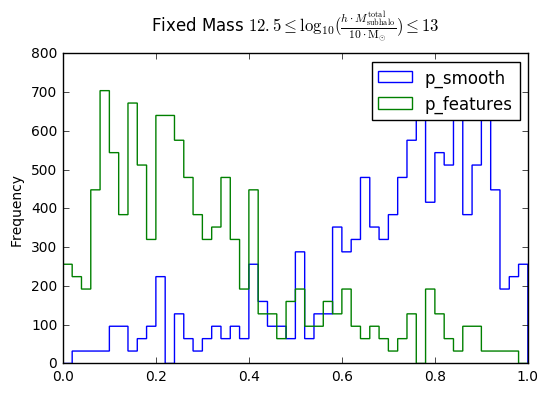

In [129]:
fixedMassVoteFracFig = plt.figure(figsize=(15, 15))
plt.suptitle('Illustris vote fraction distributions for resampled datasets', size=12)
for index, dataset in enumerate([(finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_mass'])]) :
    cut = (dataset['mass_log_msun'] > 12.5) & (dataset['mass_log_msun'] < 13)
    dataset[cut][['p_smooth','p_features']].plot.hist(bins=50, histtype='step', logy=False, fill=False)
    plt.title(r'Fixed Mass $12.5 \leq \log_{10}(\frac{h\cdot M_{\rm subhalo}^{\rm total}}{\rm 10 \cdot M_{\odot}}) \leq 13$', y=1.05)

### Illustris vote fraction distributions for the `fixed_view` data sample

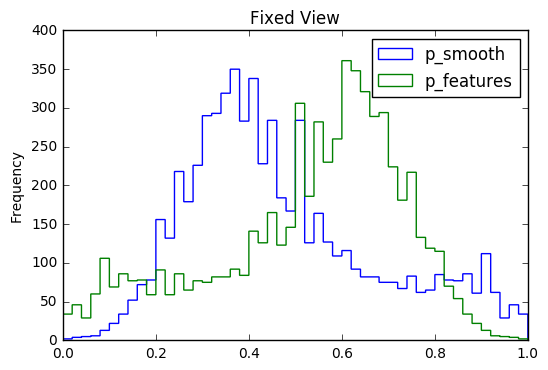

In [130]:
fixedViewVoteFracFig = plt.figure(figsize=(15, 15))
plt.suptitle('Illustris vote fraction distributions for resampled datasets', size=12)
for index, dataset in enumerate([(finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_view'])]) :
    dataset[['p_smooth','p_features']].plot.hist(bins=50, histtype='step', logy=False, fill=False, title='Fixed View')

## Comparison between the Illustris and Galaxy Zoo 2 vote fraction distributions
### Comparison with the `fixed_mass` Illustris dataset

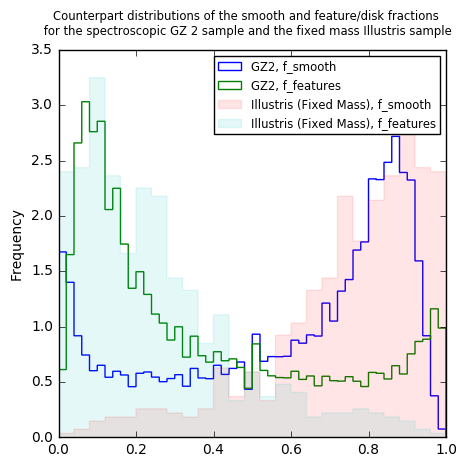

In [132]:
sdssSmoothFeatureVoteFracFigure = plt.figure(figsize=(5,5))
sdssResult[['t01_smooth_or_features_a01_smooth_fraction', 't01_smooth_or_features_a02_features_or_disk_fraction']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=50, histtype='step', logy=False, fill=False, normed=True)
finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['first_fixed_mass'][['p_smooth','p_features']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=25, histtype='step', logy=False, fill=True, alpha=0.1, normed=True)

lines, labels = sdssSmoothFeatureVoteFracFigure.gca().get_legend_handles_labels()
labels = ['GZ2, f_smooth','GZ2, f_features', r'Illustris (Fixed Mass), f_smooth', r'Illustris (Fixed Mass), f_features']
sdssSmoothFeatureVoteFracFigure.gca().legend(lines[:4], labels[:4], loc='best', fontsize='small')

sdssSmoothFeatureVoteFracFigure.suptitle('Counterpart distributions of the smooth and feature/disk fractions\n for the spectroscopic GZ 2 sample and the fixed mass Illustris sample', size='small')



### Comparison with the `fixed_view` Illustris dataset

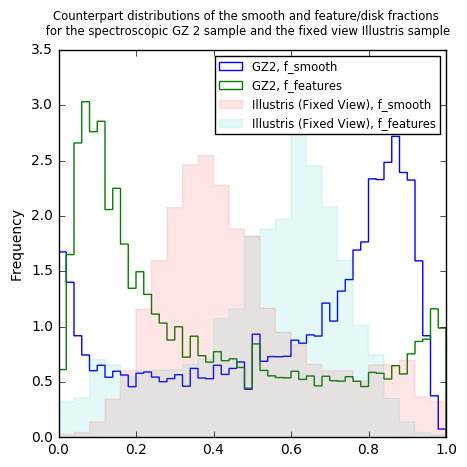

In [133]:
sdssSmoothFeatureVoteFracFigure = plt.figure(figsize=(5,5))
sdssResult[['t01_smooth_or_features_a01_smooth_fraction', 't01_smooth_or_features_a02_features_or_disk_fraction']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=50, histtype='step', logy=False, fill=False, normed=True)
finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_view'][['p_smooth','p_features']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=25, histtype='step', logy=False, fill=True, alpha=0.1, normed=True)

lines, labels = sdssSmoothFeatureVoteFracFigure.gca().get_legend_handles_labels()
labels = ['GZ2, f_smooth','GZ2, f_features', r'Illustris (Fixed View), f_smooth', r'Illustris (Fixed View), f_features']
sdssSmoothFeatureVoteFracFigure.gca().legend(lines[:4], labels[:4], loc='best', fontsize='small')

sdssSmoothFeatureVoteFracFigure.suptitle('Counterpart distributions of the smooth and feature/disk fractions\n for the spectroscopic GZ 2 sample and the fixed view Illustris sample', size='small')

### Comparison with the `fixed_view_and_first_fixed_mass` Illustris dataset

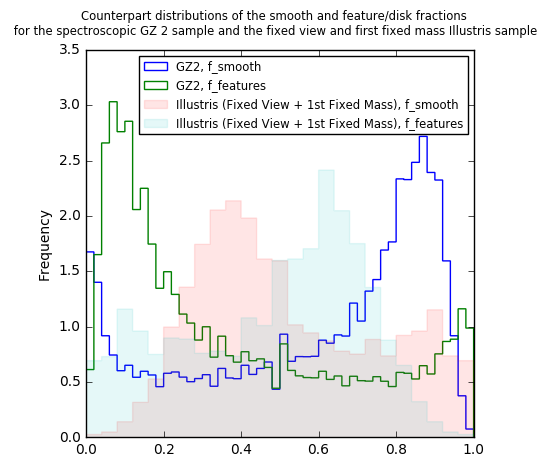

In [134]:
sdssSmoothFeatureVoteFracFigure = plt.figure(figsize=(5,5))
sdssResult[['t01_smooth_or_features_a01_smooth_fraction', 't01_smooth_or_features_a02_features_or_disk_fraction']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=50, histtype='step', logy=False, fill=False, normed=True)
finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_view_and_first_fixed_mass'][['p_smooth','p_features']].plot.hist(ax=sdssSmoothFeatureVoteFracFigure.gca(),bins=25, histtype='step', logy=False, fill=True, alpha=0.1, normed=True)

lines, labels = sdssSmoothFeatureVoteFracFigure.gca().get_legend_handles_labels()
labels = ['GZ2, f_smooth','GZ2, f_features', r'Illustris (Fixed View + 1st Fixed Mass), f_smooth', r'Illustris (Fixed View + 1st Fixed Mass), f_features']
sdssSmoothFeatureVoteFracFigure.gca().legend(lines[:4], labels[:4], loc='best', fontsize='small')

sdssSmoothFeatureVoteFracFigure.suptitle('Counterpart distributions of the smooth and feature/disk fractions\n for the spectroscopic GZ 2 sample and the fixed view and first fixed mass Illustris sample', size='small')

## Plot Illustris vote fractions for subsets defined in terms of *stellar* mass

13699 4168
20511 2866
315 209


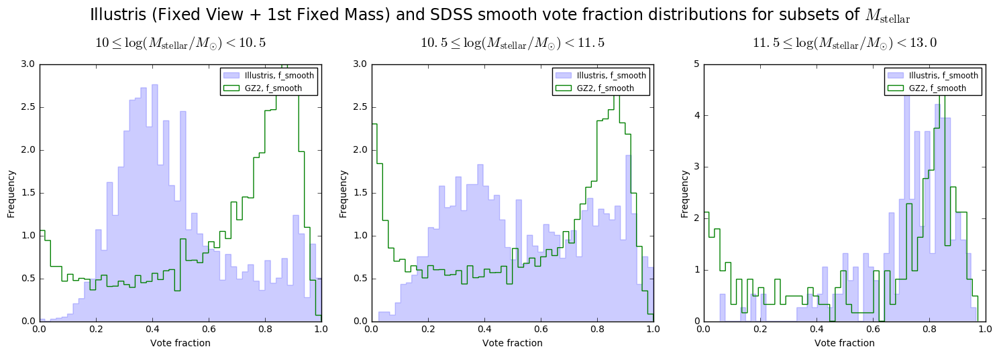

In [312]:
gc.collect()
stellarMassRanges = [ [10, 10.5], [10.5, 11.5], [11.5, 13.0] ] # Units are log_10(solar mass)

dataFrameWithStellarMass = finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_view_and_first_fixed_mass']
dataFrameWithStellarMass['mass_stars_natural_units'] = np.log10(10**10*dataFrameWithStellarMass["mass_stars"]/hubbleH)

slicedVoteFracFigure = plt.figure(figsize=(5*len(stellarMassRanges), 5))

for rangeIndex, stellarMassRange in enumerate(stellarMassRanges) :
    subPlotAxis = plt.subplot(100 + 10*len(stellarMassRanges) + rangeIndex + 1)
    IllustrisCut = ((dataFrameWithStellarMass['mass_stars_natural_units'] >= stellarMassRange[0]) & (dataFrameWithStellarMass['mass_stars_natural_units'] < stellarMassRange[1])) 
    sdssCut = ((sdssResult['lgm_tot_p97p5'] >= stellarMassRange[0]) & (sdssResult['lgm_tot_p97p5'] < stellarMassRange[1])) 
    #dataFrameWithStellarMass[cut][['p_smooth','p_features']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', fill=True, alpha=0.2, normed=True)
    dataFrameWithStellarMass[IllustrisCut][['p_smooth']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', fill=True, alpha=0.2, normed=True)
    subPlotAxis.set_title(r'${}\leq \log(M_{}/M_{}) < {}$'.format(stellarMassRange[0], r'{\rm stellar}', r'{\odot}', stellarMassRange[1]), size=15, y=1.05)
    subPlotAxis.set_xlabel('Vote fraction')
    #sdssResult[['t01_smooth_or_features_a01_smooth_fraction', 't01_smooth_or_features_a02_features_or_disk_fraction']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', logy=False, fill=False, normed=True)
    sdssResult[sdssCut][['t01_smooth_or_features_a01_smooth_fraction']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', logy=False, fill=False, normed=True)
    lines, labels = subPlotAxis.get_legend_handles_labels()
    labels = [r'Illustris, f_smooth', 'GZ2, f_smooth']
    subPlotAxis.legend(lines[:2], labels[:2], loc='best', fontsize='small')
    print(len(sdssResult[sdssCut].index), len(dataFrameWithStellarMass[IllustrisCut].index))

plt.suptitle(r'Illustris (Fixed View + 1st Fixed Mass) and SDSS smooth vote fraction distributions for subsets of $M_{\rm stellar}$', y=1.05, size=17)
plt.tight_layout()

## Compare Illustris and SDSS vote fraction distributions for separate SDSS A/B subsets
To investigate how the absence of dust simulation in the *Illustris* dataset affects the vote fraction distributions, the subsample of SDSS galaxies for which an exponential profile fit (indicated by `fracDeV_*` < 0.5, and likely indicating a disk dominated galaxy) is preferred, is further subdivided into bins of major-to-minor axis length ratio and the corresponding vote fraction distribution compared with the Illustris vote fraction distribution.

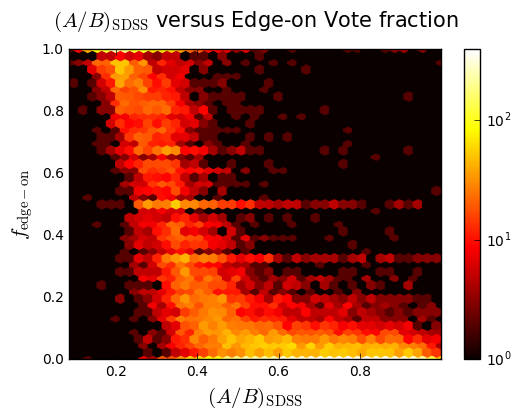

In [220]:
gc.collect()
expPreferredSdssResults = sdssResult[(sdssResult['fracDeV_r'] < 0.5)]
illustrisFrame = finalIllustris1RedshiftZeroSubHaloDataFramesWithVotes['fixed_view_and_first_fixed_mass']

sdssAbFigure = plt.figure(figsize=(5, 5))

sdssAbAxis = expPreferredSdssResults.dropna().plot.hexbin(x='expAB_r', y='t02_edgeon_a04_yes_fraction', cmap='hot', gridsize=40, sharex=False, norm=matplotlib.colors.LogNorm())
sdssAbAxis.set_ylabel(r'$f_{\rm edge-on}$', size=15)
sdssAbAxis.set_xlabel(r'$(A/B)_{\rm SDSS}$', size=15)
sdssAbAxis.set_title(r'$(A/B)_{\rm SDSS}$ versus Edge-on Vote fraction', size=15, y=1.05)


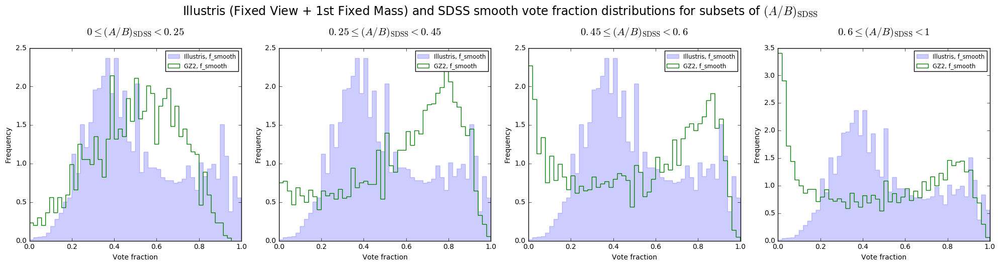

In [187]:
gc.collect()
sdssAbRanges = [[0, 0.25], [0.25, 0.45], [0.45, 0.6], [0.6, 1]]
slicedVoteFracFigure = plt.figure(figsize=(5*len(sdssAbRanges), 5))

for rangeIndex, sdssAbRange in enumerate(sdssAbRanges) :
    subPlotAxis = plt.subplot(100 + 10*len(sdssAbRanges) + rangeIndex + 1)
    cut = ((expPreferredSdssResults['expAB_r'] >= sdssAbRange[0]) & (expPreferredSdssResults['expAB_r'] < sdssAbRange[1])) 
    #illustrisFrame[['p_smooth','p_features']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', fill=True, alpha=0.2, normed=True)
    illustrisFrame[['p_smooth']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', fill=True, alpha=0.2, normed=True)
    subPlotAxis.set_title(r'${}\leq (A/B)_{} < {}$'.format(sdssAbRange[0], r'{\rm SDSS}', sdssAbRange[1]), size=15, y=1.05)
    subPlotAxis.set_xlabel('Vote fraction')
    #expPreferredSdssResults[cut][['t01_smooth_or_features_a01_smooth_fraction', 't01_smooth_or_features_a02_features_or_disk_fraction']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', logy=False, fill=False, normed=True)
    expPreferredSdssResults[cut][['t01_smooth_or_features_a01_smooth_fraction']].plot.hist(ax=subPlotAxis, bins=50, histtype='step', logy=False, fill=False, normed=True)
    lines, labels = subPlotAxis.get_legend_handles_labels()
    labels = [r'Illustris, f_smooth', 'GZ2, f_smooth']
    subPlotAxis.legend(lines[:2], labels[:2], loc='best', fontsize='small')
    
plt.suptitle(r'Illustris (Fixed View + 1st Fixed Mass) and SDSS smooth vote fraction distributions for subsets of $(A/B)_{\rm SDSS}$', y=1.05, size=17)
plt.tight_layout()

## Compare distributions of absolute magnitude for mass-matched SDSS and Illustris samples
There are two columns provided by the illustris collaboration that may refer to absolute magnitude: `absmag_*` and `stellarphotometrics_*` where `*` $\in$ [u,g,r,i,z] represents the SDSS apectral band. In fact, it seems like counterpart columns contain identical data. Unfortunately, neither match the SDSS distributions!

The [SDSS CasJobs database](http://skyserver.sdss.org/dr13/en/help/browser/browser.aspx#&&history=description+SpecPhoto+V) provides many variants of observed magnitudes. The subsequently plotted data are derived from the `petroMag_*` columns (where as above `*` $\in$ [u,g,r,i,z] represents the SDSS spectral band) and converted to absolute magnitude using the CasJobs database function [fCosmoAbsMag()](http://skyserver.sdss.org/dr13/en/help/browser/browser.aspx#&&history=description+fCosmoAbsMag+F). The conversion is currently done using the default cosmological values, which are derived from WMAP-5 data. 

**These are slightly different from those used by [Illustris](http://www.illustris-project.org/data/downloads/Illustris-1/) in their simulation, which are derived from WMAP-9**.

Begin by defining the *apparent* Petrosian magnitudes for the SDSS survey in each band $\in$ [u,g,r,i,z].

In [98]:
apparentMagLimits = {'u':22,
                     'g':22.2,
                     'r':17.77,
                     'i':21.3,
                     'z':20.5}

The `absmag_` column is plotted first.

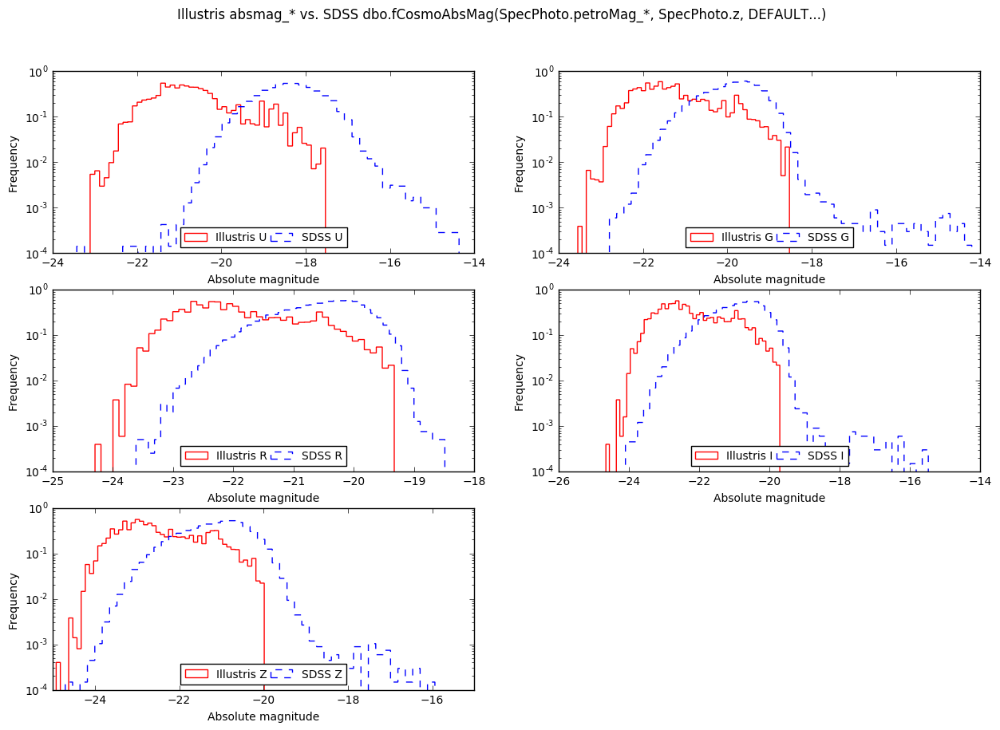

In [99]:
gc.collect()

bootstrapMagCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagCompSloanIlustrisFigure.suptitle('Illustris absmag_* vs. SDSS dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)', size=12)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    if gzSampleSubset == 'full' :
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass'][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view'][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='g')
    else :
        bootstrapPdf97p5IllustrisFrameWithVotes[['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
    sdssResult[np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['petroMag_' + value] < apparentMagLimits[value])][['absPetroMag_' + value]].plot.hist(linestyle='dashed',normed=True, ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, label='SDSS ' + value.upper(), color='b')
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass ' + str(value.upper()), 'Illustris Fixed View ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='lower center', ncol=3, columnspacing=0.3, fontsize='medium')
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='lower center', ncol=3, columnspacing=0.3, fontsize='medium')
    plt.xlabel("Absolute magnitude")

Now plot the `stellarphotometrics_*` columns.

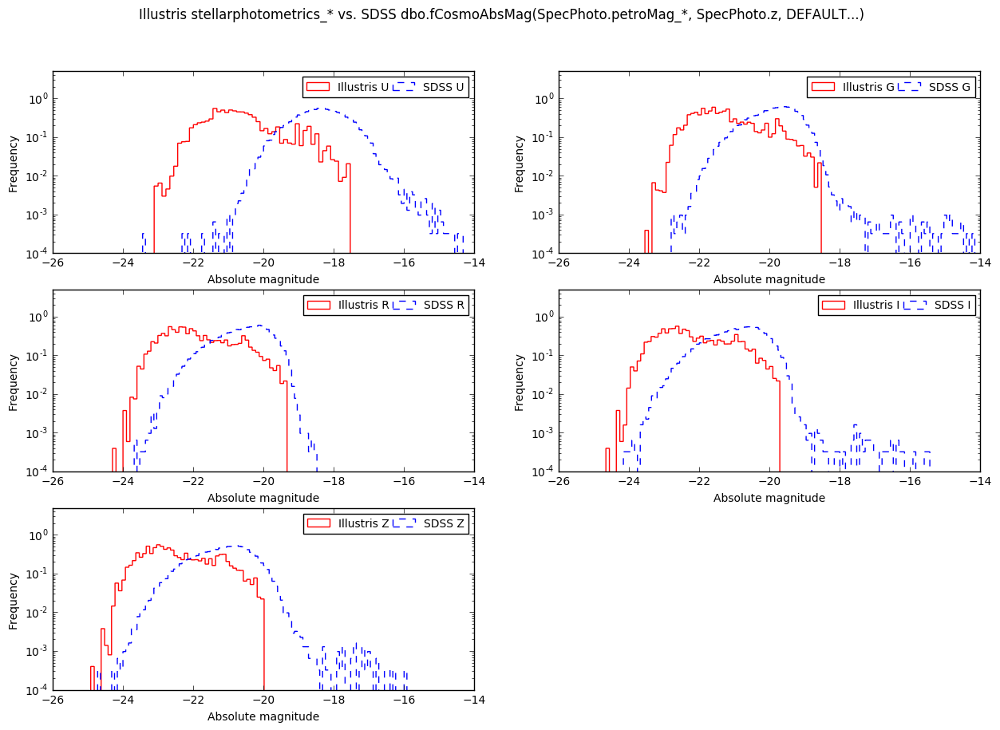

In [100]:
gc.collect()

bootstrapMagCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagCompSloanIlustrisFigure.suptitle('Illustris stellarphotometrics_* vs. SDSS dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)', size=12)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    if gzSampleSubset == 'full' :
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass'][['stellarphotometrics_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=150, range=(-26, -14),  histtype='step', logy=True, fill=False, color='r')
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view'][['stellarphotometrics_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=150, range=(-26, -14),  histtype='step', logy=True, fill=False, color='g')
    else :
        bootstrapPdf97p5IllustrisFrameWithVotes[['stellarphotometrics_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
    sdssResult[np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['petroMag_' + value] < apparentMagLimits[value])][['absPetroMag_' + value]].plot.hist(linestyle='dashed',normed=True, ax=subplotAxis, bins=150, range=(-26, -14), histtype='step', logy=True, fill=False, label='SDSS ' + value.upper())
    
    plt.ylim(1e-4, 5)
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass ' + str(value.upper()), 'Illustris Fixed View ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='best', ncol=3, columnspacing=0.3, fontsize='medium')
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='best', ncol=3, columnspacing=0.3, fontsize='medium')
    plt.xlabel("Absolute magnitude")

## Now compare bivariate distributions
**Initially** plot the absolute magnitude verus the logarithm of the stellar mass. Recall that the stellar mass distributions are matched, so the SDSS data are implicitly cut at $\log(M_{\rm stellar}) = 10$.

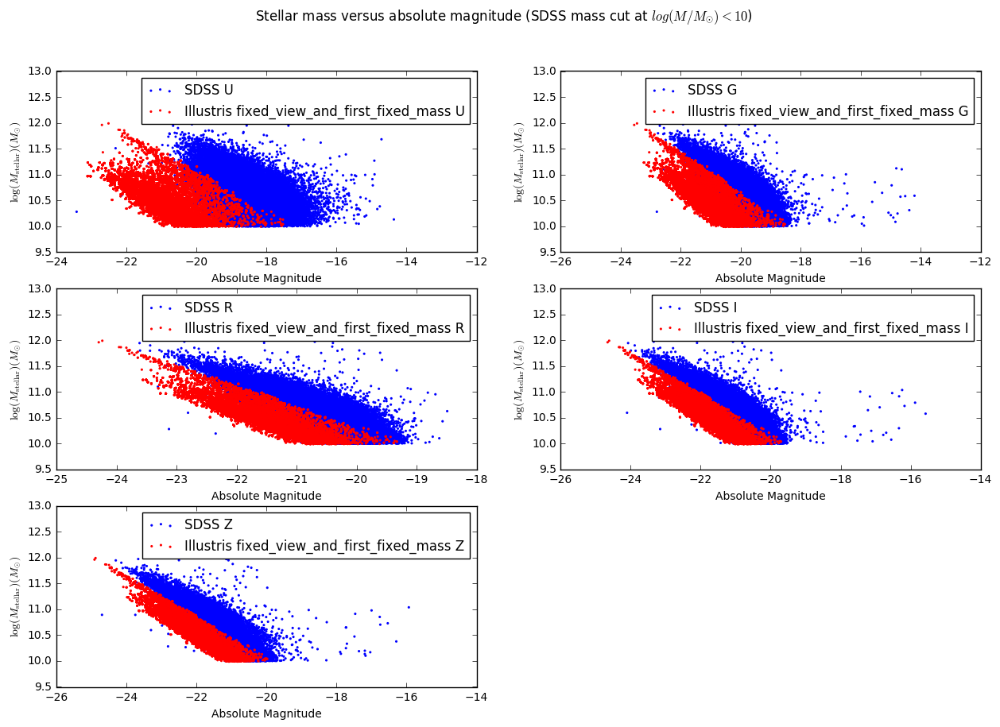

In [101]:
gc.collect()

bootstrapMagVMassCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagVMassCompSloanIlustrisFigure.suptitle(r'Stellar mass versus absolute magnitude (SDSS mass cut at $log(M/M_{\odot}) < 10$)', size=12)

bootstrapPdf97p5IllustrisFrameWithVotes['logStellarMass'] = pd.Series(np.log10(10**10*bootstrapPdf97p5IllustrisFrameWithVotes["mass_stars"]/hubbleH), index=bootstrapPdf97p5IllustrisFrameWithVotes.index)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    sdssResult[np.logical_and(np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['lgm_tot_p97p5'] > 10), sdssResult['petroMag_' + value] < apparentMagLimits[value])][['absPetroMag_' + value, 'lgm_tot_p97p5']].plot.scatter(x='absPetroMag_' + value, y='lgm_tot_p97p5', label='SDSS ' + value.upper(), ax=subplotAxis, alpha=1, marker='.', color='b', edgecolors='None', legend=True)
    if gzSampleSubset == 'full' :
        subselection = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view']
        subselection[['absmag_' + value, 'logStellarMass']].plot.scatter(x='absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='g', label='Illustris Fixed View ' + value.upper())
        subselection = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass']
        subselection[['absmag_' + value, 'logStellarMass']].plot.scatter(x='absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris Fixed Mass ' + value.upper())
    else :
        subselection = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view']
        subselection[['absmag_' + value, 'logStellarMass']].plot.scatter(x='absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris ' + gzSampleSubset + ' ' + value.upper())

    plt.ylabel(r'$\log(M_{\rm stellar}) (M_{\odot})$')    
    plt.xlabel(r'Absolute Magnitude')

## Convert absolute magnitude to luminosity
Now use $L=L_{\odot}\cdot10^{(\frac{M_{\odot} - M_{\rm galaxy}}{2.5})}$ to convert from absolute magnitude to luminosity with $M_{\odot}=-4.77$ representing the absolute magnitude of the sun and $L_{\odot}=3.9\times10^{33}\;{\rm erg\;s^{-1}}$ the solar luminosity.

The **three** outlying SDDS data with absolute magnitudes less than the minimum absolute magnitude of any sample in the illustris dataset are cut to achieve axes that better reveal the differences in distribution between the bulk of the data.

As before, there is an implicit cut at $\log_{10}(M_{\rm stellar}) = 10$.

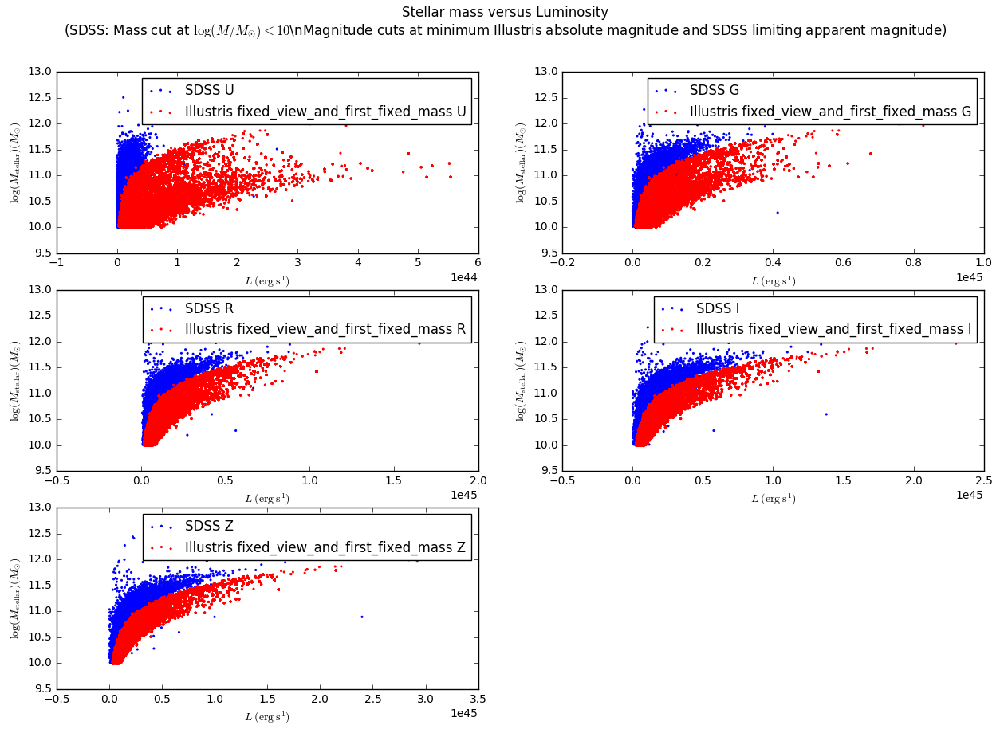

In [102]:
gc.collect()

bootstrapMagVMassCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagVMassCompSloanIlustrisFigure.suptitle('Stellar mass versus Luminosity\n' + r'(SDSS: Mass cut at $\log(M/M_{\odot}) < 10$\nMagnitude cuts at minimum Illustris absolute magnitude and SDSS limiting apparent magnitude)', size=12)

bootstrapPdf97p5IllustrisFrameWithVotes['logStellarMass'] = pd.Series(np.log10(10**10*bootstrapPdf97p5IllustrisFrameWithVotes["mass_stars"]/hubbleH), index=bootstrapPdf97p5IllustrisFrameWithVotes.index)

solarLuminosity = 3.9e33 # erg s^{-1}
solarAbsMag = 4.77

for index, value in enumerate(['u','g','r','i','z']) :
    bootstrapPdf97p5IllustrisFrameWithVotes['lum_from_absmag_' + value] = pd.Series(solarLuminosity*(10**((solarAbsMag - bootstrapPdf97p5IllustrisFrameWithVotes['absmag_' + value])/2.5)), index=bootstrapPdf97p5IllustrisFrameWithVotes.index)
    sdssResult['lum_from_absPetroMag_' + value] = pd.Series(solarLuminosity*(10**((solarAbsMag - sdssResult['absPetroMag_' + value])/2.5)), index=sdssResult.index)
    
    minIllustrisAbsMag = bootstrapPdf97p5IllustrisFrameWithVotes['absmag_' + value].min()
    
    subplotAxis = plt.subplot(3, 2, index+1)
    sdssResult[np.logical_and(
        np.logical_and(sdssResult['absPetroMag_' + value] > minIllustrisAbsMag,
                       sdssResult['lgm_tot_p97p5'] > 10
                      ),
        sdssResult['petroMag_' + value] < apparentMagLimits[value]
    )][['lum_from_absPetroMag_' + value, 'lgm_tot_p97p5']].plot.scatter(x='lum_from_absPetroMag_' + value, y='lgm_tot_p97p5', label='SDSS ' + value.upper(), ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='b', legend=True)
    
    if gzSampleSubset == 'full' :
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view'][['lum_from_absmag_' + value, 'logStellarMass']].plot.scatter(x='lum_from_absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='g', label='Illustris Fixed View ' + value.upper())
        bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass'][['lum_from_absmag_' + value, 'logStellarMass']].plot.scatter(x='lum_from_absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris Fixed Mass ' + value.upper())
    else :
        bootstrapPdf97p5IllustrisFrameWithVotes[['lum_from_absmag_' + value, 'logStellarMass']].plot.scatter(x='lum_from_absmag_' + value, y='logStellarMass',ax=subplotAxis, alpha=1, marker='.', edgecolors='None', color='r', label='Illustris ' + gzSampleSubset + ' ' + value.upper())
    
    plt.ylabel(r'$\log(M_{\rm stellar}) (M_{\odot})$')    
    plt.xlabel(r'$L\;({\rm erg\;s^{1}})$')

## Distributions of the $L/M_{\rm stellar}$ ratio for the mass-matched Illustris and SDSS samples.
The SDSS data selection mirror the previous set of plots.

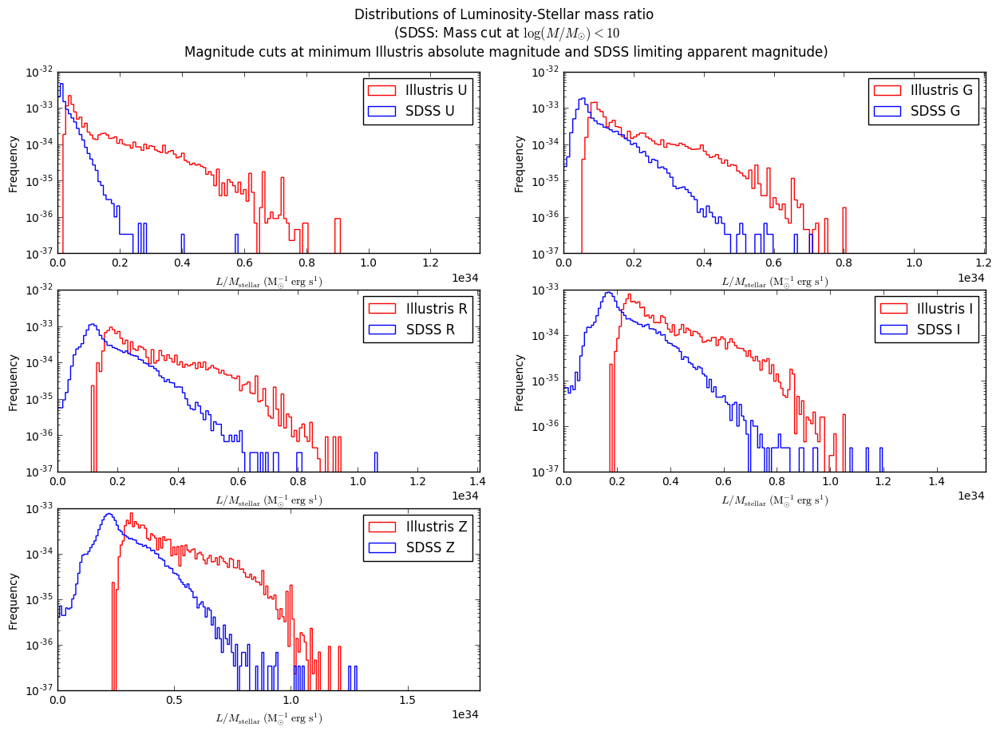

In [103]:
gc.collect()

bootstrapMagOverMassCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagOverMassCompSloanIlustrisFigure.suptitle('Distributions of Luminosity-Stellar mass ratio \n(SDSS: Mass cut at $\log(M/M_{\odot}) < 10$\nMagnitude cuts at minimum Illustris absolute magnitude and SDSS limiting apparent magnitude)', size=12)

bootstrapPdf97p5IllustrisFrameWithVotes['logStellarMass'] = pd.Series(np.log10(10**10*bootstrapPdf97p5IllustrisFrameWithVotes["mass_stars"]/hubbleH), index=bootstrapPdf97p5IllustrisFrameWithVotes.index)

solarLuminosity = 3.9e33 # erg s^{-1}

for index, value in enumerate(['u','g','r','i','z']) :    
    subplotAxis = plt.subplot(3, 2, index+1)
    bootstrapFrameSubset = None
    maxIllustrisValue = None
    if gzSampleSubset == 'full' :
        bootstrapFrameSubset = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_mass'][['lum_from_absmag_' + value, 'logStellarMass']]
        (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).plot.hist(ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, color='r', normed=True)
        maxIllustrisValue = (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).max()
        bootstrapFrameSubset = bootstrapPdf97p5IllustrisFrameWithVotes[bootstrapPdf97p5IllustrisFrameWithVotes['priority'] == 'fixed_view'][['lum_from_absmag_' + value, 'logStellarMass']]
        (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).plot.hist(ax=subplotAxis, bins=150, range=(0, 1.3e34), histtype='step', logy=True, fill=False, color='g', normed=True)
        maxIllustrisValue = max(maxIllustrisValue, (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).max())
    else :
        bootstrapFrameSubset = bootstrapPdf97p5IllustrisFrameWithVotes[['lum_from_absmag_' + value, 'logStellarMass']]
        (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).plot.hist(ax=subplotAxis, bins=150, range=(0, 1.3e34), histtype='step', logy=True, fill=False, color='r', normed=True)
        maxIllustrisValue = (bootstrapFrameSubset['lum_from_absmag_' + value]/(10**bootstrapFrameSubset['logStellarMass'])).max()
    
    sdssResultSubset = sdssResult[np.logical_and(
                np.logical_and(sdssResult['absPetroMag_' + value] > minIllustrisAbsMag,
                               sdssResult['lgm_tot_p97p5'] > 10
                              ),
                sdssResult['petroMag_' + value] < apparentMagLimits[value]
            )][['lum_from_absPetroMag_' + value, 'lgm_tot_p97p5']]
        
    (sdssResultSubset['lum_from_absPetroMag_' + value]/(10**sdssResultSubset['lgm_tot_p97p5'])).plot.hist(ax=subplotAxis, bins=150, range=(0, 1.3e34), histtype='step', logy=True, fill=False, color='b', normed=True)
    plt.xlabel(r'$L/M_{\rm stellar}\;({\rm M_{\odot}^{-1}\;erg\;s^{1}})$')
    plt.xlim(0, 1.5*maxIllustrisValue)
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass ' + str(value.upper()), 'Illustris Fixed View ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='best')
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='best')

## Generate distributions for subsets of data classified as *edge on* or *not edge on* 

### Begin by computing columns for the SDSS data that are equivalent to the Illustris `edge_on*` cases

In [104]:
sdssResult['is_edge_on'] = sdssResult['t02_edgeon_a04_yes_count'] > sdssResult['t02_edgeon_a05_no_count']
sdssResult['is_features_and_edge_on'] = np.logical_and(sdssResult['t01_smooth_or_features_a02_features_or_disk_fraction'] > 0.6, sdssResult['is_edge_on'])  
if verbose :
    prettyPrinter.pprint(sdssResult.columns.values)

### First plot the absolute magnitude distributions for *edge on* galaxies

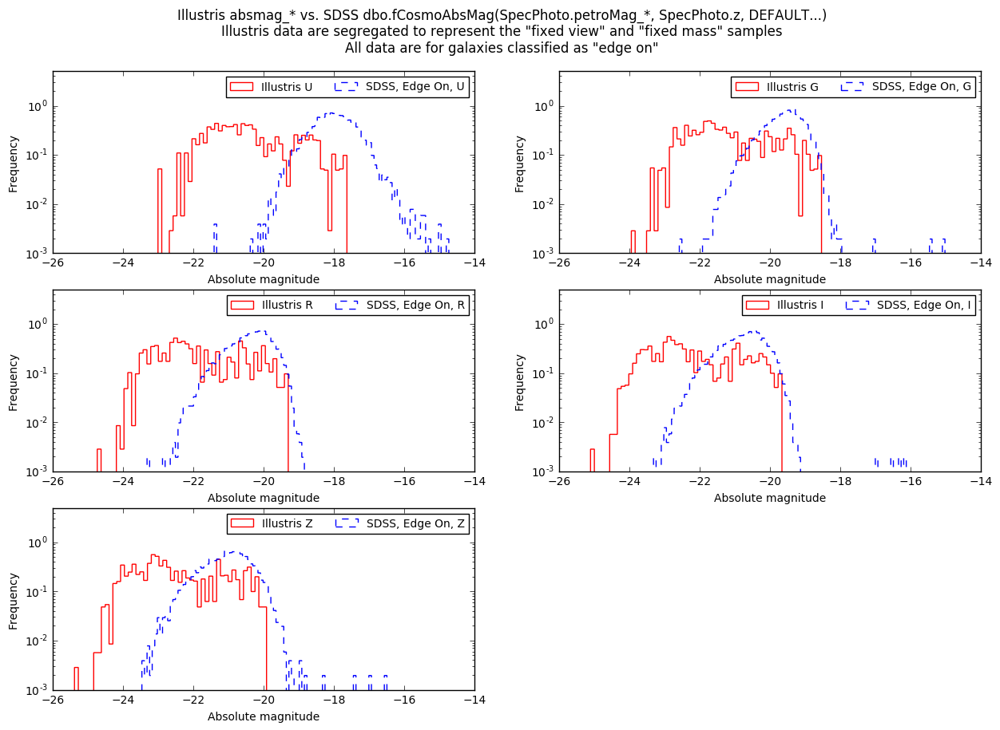

In [105]:
gc.collect()

preCutDataFrame = finalIllustris1RedshiftZeroSubHaloDataFrames["full"]
#bootstrapPdf97p5IllustrisFrameWithVotes

bootstrapMagCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagCompSloanIlustrisFigure.suptitle('Illustris absmag_* vs. SDSS dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)\nIllustris data are segregated to represent the "fixed view" and "fixed mass" samples\nAll data are for galaxies classified as "edge on"', size=12)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    if gzSampleSubset == 'full' :
        preCutDataFrame[np.logical_and(preCutDataFrame['priority'] == 'fixed_view', preCutDataFrame['is_edge_on'])][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True, bins=150, range=(-25, -14), histtype='step', logy=True, fill=False, color='r')
        preCutDataFrame[np.logical_and(preCutDataFrame['priority'] == 'fixed_mass', preCutDataFrame['is_edge_on'])][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True, bins=150, range=(-25, -14), histtype='step', logy=True, fill=False, color='g')
    else :
        preCutDataFrame[preCutDataFrame['is_edge_on']][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
    sdssResult[np.logical_and(sdssResult['is_edge_on'], np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['petroMag_' + value] < apparentMagLimits[value]))][['absPetroMag_' + value]].plot.hist(linestyle='dashed',normed=True, ax=subplotAxis, bins=150, range=(-25, -14), histtype='step', logy=True, fill=False, label='SDSS ' + value.upper(), color='b')
    
    plt.ylim(1e-3, 5)
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass, Edge On, ' + str(value.upper()), 'Illustris Fixed View, Edge On, ' + str(value.upper()), 'SDSS, Edge On, ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='best', fontsize='medium', ncol=2)
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS, Edge On, ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='best', fontsize='medium', ncol=2)
    plt.xlabel("Absolute magnitude")

### Second First plot the absolute magnitude distributions for *NOT edge on* galaxies

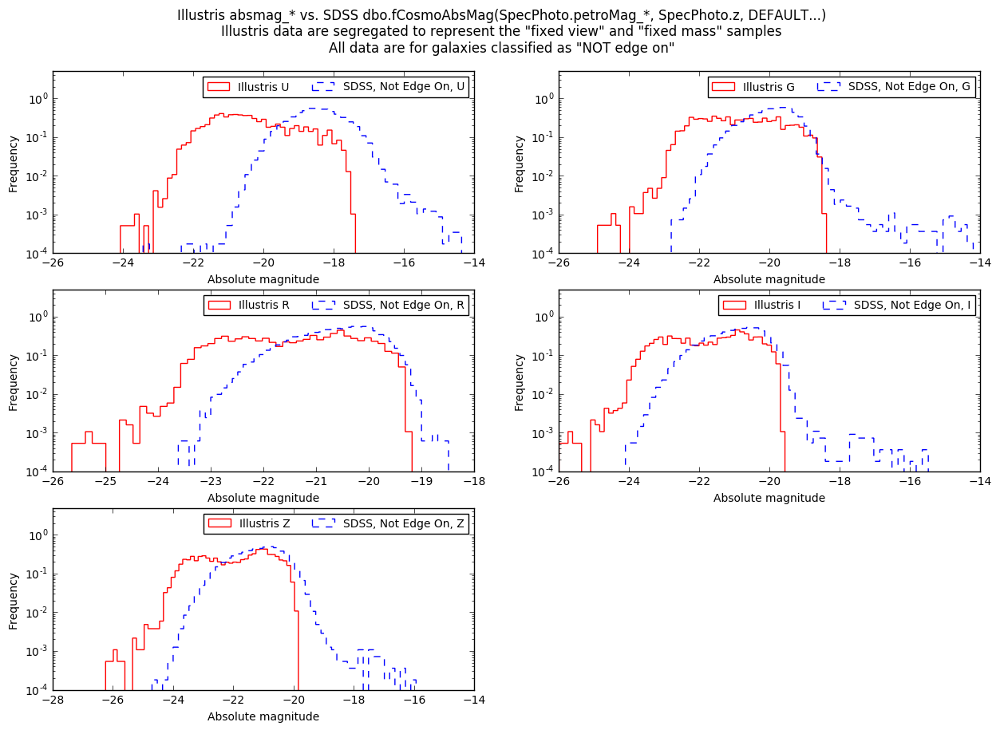

In [106]:
gc.collect()

preCutDataFrame = finalIllustris1RedshiftZeroSubHaloDataFrames["full"]
#bootstrapPdf97p5IllustrisFrameWithVotes

bootstrapMagCompSloanIlustrisFigure = plt.figure(figsize=(15, 10))
bootstrapMagCompSloanIlustrisFigure.suptitle('Illustris absmag_* vs. SDSS dbo.fCosmoAbsMag(SpecPhoto.petroMag_*, SpecPhoto.z, DEFAULT...)\nIllustris data are segregated to represent the "fixed view" and "fixed mass" samples\nAll data are for galaxies classified as "NOT edge on"', size=12)

for index, value in enumerate(['u','g','r','i','z']) :
    subplotAxis = plt.subplot(3, 2, index+1)
    if gzSampleSubset == 'full' :
        preCutDataFrame[np.logical_and(preCutDataFrame['priority'] == 'fixed_view', np.logical_not(preCutDataFrame['is_edge_on']))][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=20, histtype='step', logy=True, fill=False, color='r')
        preCutDataFrame[np.logical_and(preCutDataFrame['priority'] == 'fixed_mass', np.logical_not(preCutDataFrame['is_edge_on']))][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=20, histtype='step', logy=True, fill=False, color='g')
    else :
        preCutDataFrame[np.logical_not(preCutDataFrame['is_edge_on'])][['absmag_' + value]].plot.hist(ax=subplotAxis, normed=True,bins=50, histtype='step', logy=True, fill=False, color='r')
    sdssResult[np.logical_and(np.logical_not(sdssResult['is_edge_on']), np.logical_and(sdssResult['absPetroMag_r'] > -9000, sdssResult['petroMag_' + value] < apparentMagLimits[value]))][['absPetroMag_' + value]].plot.hist(linestyle='dashed',normed=True, ax=subplotAxis, bins=50, histtype='step', logy=True, fill=False, label='SDSS ' + value.upper(), color='b')
    
    plt.ylim(1e-4, 5)
    lines, labels = subplotAxis.get_legend_handles_labels()
    if gzSampleSubset == 'full' : 
        labels = ['Illustris Fixed Mass, Not Edge On, ' + str(value.upper()), 'Illustris Fixed View, Edge On, ' + str(value.upper()), 'SDSS, Not Edge On, ' + str(value.upper())]
        subplotAxis.legend(lines[:3], labels[:3], loc='best', fontsize='medium', ncol=2)
    else :
        labels = ['Illustris ' + str(value.upper()), 'SDSS, Not Edge On, ' + str(value.upper())]
        subplotAxis.legend(lines[:2], labels[:2], loc='best', fontsize='medium', ncol=2)
    plt.xlabel("Absolute magnitude")